# Modelado dinámico de degradación de motores de aviones Turbofan mediante UDEs

Este notebook implementa:

- Preprocesamiento de datos
- Construcción y desarrollo de modelo de probabilidad
- NODE (Neural ODE)
- UDE (Universal Differential Equation)
- Comparación de resultados

In [3]:
using Pkg
Pkg.activate(".")



#solo la primera vez:
#Pkg.instantiate()

  Activating project at `c:\Users\usuario\Desktop\TP-DegradacionDeMotores\mi_entorno`


## Todas los paquetes que utilizaremos.

In [ ]:
ENV["GKSwstype"] = "100"

using CSV
using DataFrames
using Statistics
using Plots

using Lux
using ComponentArrays
using Random
Random.seed!(42)

using OrdinaryDiffEq
using SciMLSensitivity

using Optimization
using OptimizationOptimisers
using Zygote
using DataInterpolations

#batches
using MLUtils
using LinearAlgebra

#regresionLogistica
using GLM
using StatsModels

## Carga de datos

In [5]:
dataset_path = joinpath(pwd(), "..", "CMaps", "train_FD001.txt")

train_df = CSV.read(
    dataset_path,
    DataFrame;
    delim=' ',
    ignorerepeated=true,
    header=false
)


#agregamos los nombres de la columnas ya que el dataset original venian sin ellos
rename!(
    train_df,
    vcat(
        ["unit", "cycle", "setting1", "setting2", "setting3"],
        ["s$i" for i in 1:21]
    )
)

first(train_df, 5)

Row,unit,cycle,setting1,setting2,setting3,s1,s2,s3,s4,s5,s6,s7,s8,s9,s10,s11,s12,s13,s14,s15,s16,s17,s18,s19,s20,s21
,Int64,Int64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Int64,Int64,Float64,Float64,Float64
1,1,1,-0.0007,-0.0004,100.0,518.67,641.82,1589.7,1400.6,14.62,21.61,554.36,2388.06,9046.19,1.3,47.47,521.66,2388.02,8138.62,8.4195,0.03,392,2388,100.0,39.06,23.419
2,1,2,0.0019,-0.0003,100.0,518.67,642.15,1591.82,1403.14,14.62,21.61,553.75,2388.04,9044.07,1.3,47.49,522.28,2388.07,8131.49,8.4318,0.03,392,2388,100.0,39.0,23.4236
3,1,3,-0.0043,0.0003,100.0,518.67,642.35,1587.99,1404.2,14.62,21.61,554.26,2388.08,9052.94,1.3,47.27,522.42,2388.03,8133.23,8.4178,0.03,390,2388,100.0,38.95,23.3442
4,1,4,0.0007,0.0,100.0,518.67,642.35,1582.79,1401.87,14.62,21.61,554.45,2388.11,9049.48,1.3,47.13,522.86,2388.08,8133.83,8.3682,0.03,392,2388,100.0,38.88,23.3739
5,1,5,-0.0019,-0.0002,100.0,518.67,642.37,1582.85,1406.22,14.62,21.61,554.0,2388.06,9055.15,1.3,47.28,522.19,2388.04,8133.8,8.4294,0.03,393,2388,100.0,38.9,23.4044


## Normalización de sensores y settings

In [6]:
#Normalizamos los datos de los sensores y settings para mejorar entrenamiento de redes neuronales.


sensor_cols = ["s$i" for i in 1:21]
setting_cols = ["setting1", "setting2", "setting3"]
    
for col in sensor_cols
    μ = mean(train_df[!, col])
    σ_col = std(train_df[!, col])
    train_df[!, col] = (train_df[!, col] .- μ) ./ σ_col
end
    
for col in setting_cols
    μ = mean(train_df[!, col])
    σ_col = std(train_df[!, col])
    train_df[!, col] = (train_df[!, col] .- μ) ./ σ_col
end

## Modelado de la falla mediante análisis de supervivencia

Inicialmente, la probabilidad de falla se construía a partir del RUL (Remaining Useful Life) utilizando una transformación sigmoidal:

$$
p_{\text{fail}} = \sigma(k(\text{threshold} - RUL))
$$

Sin embargo, esta construcción introduce supuestos arbitrarios, ya que tanto la forma funcional como los parámetros utilizados no provienen directamente de los datos observados.

Para evitar este problema, reformulamos el problema como uno de **supervivencia discreta**.

### Variable objetivo

Para cada instante temporal \(t\) de una trayectoria, definimos la variable objetivo:

$$
y_t =
\begin{cases}
1 & \text{si el motor falla en el ciclo t}\\
0 & \text{si el motor continúa funcionando}
\end{cases}
$$

Dado que en el dataset de entrenamiento cada trayectoria finaliza en la falla, la última observación de cada motor recibe la etiqueta 1 y todas las observaciones anteriores reciben la etiqueta 0.

### Modelo

Se mantiene la estructura dinámica basada en Neural Ordinary Differential Equations (NODEs). El estado latente \(z(t)\) evoluciona según

$$
\frac{dz}{dt}=f_\theta(z(t),x(t)),
$$

donde \(x(t)\) representa las mediciones de sensores y condiciones operativas.

A partir del estado latente se obtiene una probabilidad mediante una capa de salida sigmoidal:

$$
h_t = \sigma(g_\theta(z_t)).
$$

Esta cantidad se interpreta como la probabilidad de que el motor falle en el próximo ciclo, condicionada a haber sobrevivido hasta el instante actual.

### Entrenamiento

El entrenamiento se realiza mediante máxima verosimilitud para supervivencia discreta. Para una trayectoria que falla en el ciclo \(T\), la probabilidad observada es

$$
P(T)=\left(\prod_{t=1}^{T-1}(1-h_t)\right)h_T.
$$

Equivalentemente, se minimiza la log-verosimilitud negativa:

$$
\mathcal{L}
=
-\sum_{t=1}^{T-1}\log(1-h_t)
-\log(h_T).
$$

Esta formulación permite obtener probabilidades de falla directamente a partir de los datos observados, sin necesidad de construir etiquetas probabilísticas artificiales a partir del RUL.

In [7]:
train_df.event = zeros(Int, nrow(train_df))

for g in groupby(train_df, :unit)
    idx = parentindices(g)[1][end]
    train_df.event[idx] = 1
end



Verificamos:

In [8]:
combine(groupby(train_df, :unit), :event => sum) 
#deberia dar 1 por cada motor

Row,unit,event_sum
,Int64,Int64
1,1,1
2,2,1
3,3,1
4,4,1
5,5,1
6,6,1
7,7,1
8,8,1
9,9,1


## Ejemplo de la nueva columna

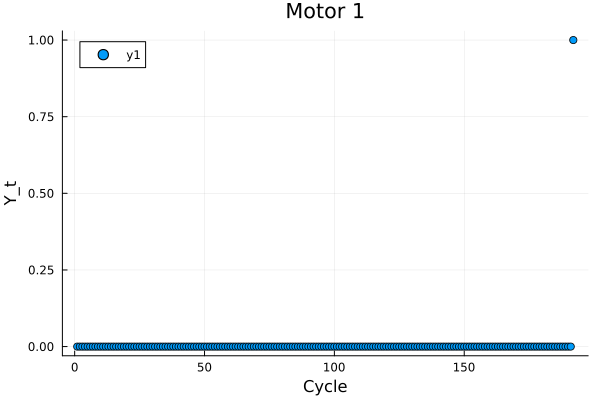

In [9]:
motor1 = filter(row -> row.unit == 1, train_df)
    
plt = scatter(
    motor1.cycle,
    motor1.event,
    xlabel="Cycle",
    ylabel="Y_t",
    title="Motor 1"
)
    
plt

## Trayectorias por motor

In [10]:
#agrupamos por unidad
grouped = groupby(train_df, :unit)
    
trajectories = []
    
for g in grouped
    X = Matrix(g[:, vcat(setting_cols, sensor_cols)])
    y = g.event
    t = g.cycle
    
    push!(trajectories, (X=X, y=y, t=t))
end

## NODE

$$
\frac{dz}{dt} =  NN(z,t)
$$

El primer modelo que vamos a probar es una NODE sin utilizar información de los sensores. Luego aplicamos sigmoide como habíamos comentado antes

In [11]:
#elegimos una trayectoria
traj = trajectories[1]

print(trajectories)

t = Float64.(traj.t)
y = Float64.(traj.y)
    
u0 = [-10.0] #Para el baseline ponemos cond inicial que haga dar una proba chica. Despues lo podemos ir cambiando
    
#generador de numeros aleatorios, sirve para inicializar los pesos de la red
rng = Random.default_rng()

#estructura de la red
nn = Lux.Chain(
    Lux.Dense(2, 16, tanh),
    Lux.Dense(16, 1)
)

#p: parametros entrenables de la red, st: estados internos
p_node, st_node = Lux.setup(rng, nn)
#esto es para que funcione bien la optimizacion
p_node = ComponentArray(p_node)

Any[(X = [-0.31597202195452145 -1.3729199290729734 NaN 0.9999757643323645 -1.7216836648226865 -0.13425192213570927 -0.925913523696359 -0.9999757643323643 0.14167989491882235 1.1211133982073023 -0.516325892386186 -0.8627924043441415 0.9999757643323643 -0.2664601377187745 0.33425373913469153 -1.0588645739680291 -0.26906451920303553 -0.603801065881639 -0.9999757643323645 -0.7816908404632746 NaN NaN 1.3484600620382499 1.1943981001535333; 0.8727007771683792 -1.0316953503320596 NaN 0.9999757643323645 -1.0617539738121262 0.2115233673416215 -0.6437102649230355 -0.9999757643323643 0.14167989491882235 0.4319197071333588 -0.7980736570341316 -0.9587943771663178 0.9999757643323643 -0.1915782821843463 1.174870847738156 -0.3636371846989997 -0.6428291567796645 -0.27584512524895916 -0.9999757643323645 -0.7816908404632746 NaN NaN 1.0165032941737064 1.2368919830975704; -1.9618266668939224 1.015652122113423 NaN 0.9999757643323645 -0.6617965853206986 -0.4131555754405577 -0.5259404010255218 -0.9999757643323

Excessive output truncated after 524297 bytes.

-0.17881746820957142 1.356876700854337 NaN 0.9999757643323645 0.8780393603709116 0.4349724930887953 0.6573134202089789 -0.9999757643323643 0.14167989491882235 0.1946563052881949 0.32891740155765065 -0.9592472166607717 0.9999757643323643 1.081413261900721 -0.2894299220871243 1.0268175938327362 -1.0988954045940478 0.28941226836172945 -0.9999757643323645 -0.13601426883344866 NaN NaN -0.5326282891941103 -0.670713849064143; 0.552673485096829 0.6744275433725094 NaN 0.9999757643323645 0.358094755332192 0.4333414775723942 0.0140233145800772 -0.9999757643323643 0.14167989491882235 -0.7882920737844619 0.18804351923688095 -0.9932101787440759 0.9999757643323643 -0.04181457111551641 -0.34366328393261353 0.6096811602700539 -0.8949761282724228 -0.6357967674067472 -0.9999757643323645 -0.13601426883344866 NaN NaN -0.2559976493069777 0.39625212485681316; -0.31597202195452145 -0.6904707715911458 NaN 0.9999757643323645 -0.6018029770470527 0.7448654412052647 0.24067475076020575 -0.9999757643323643 0.141679

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.18582273 0.073365726; -1.3326262 1.9626849; … ; -1.2206342 0.22496898; 1.2360227 0.50070494], bias = Float32[0.45274794, -0.109943174, 0.2535509, 0.33633876, -0.58940434, -0.5645052, -0.6811371, -0.25305128, 0.11489113, 0.6639945, -0.4025346, -0.6888659, -0.4826754, 0.3613354, 0.48929778, -0.21674016]), layer_2 = (weight = Float32[0.3199716 0.046035804 … 0.03958083 -0.19888853], bias = Float32[-0.0893096]))

Definimos la NODE

In [12]:
function node!(du, u, p, t)
    input = [u[1], t]

    du .= nn(input, p, st_node)[1]
end

node! (generic function with 1 method)

In [13]:
#todo el intervalo de tiempo
tspan = (t[1], t[end])
	
#definimos el problema de ode
prob_node = ODEProblem(node!, u0, tspan, p_node)
	
#resolvemos con solver numerico
sol = solve(prob_node, Tsit5(), saveat=t)

#Al no haber entrenado el sistema, no se obtienen buenos resultados por ahora

retcode: Success
Interpolation: 1st order linear
t: 192-element Vector{Float64}:
   1.0
   2.0
   3.0
   4.0
   5.0
   6.0
   7.0
   8.0
   9.0
  10.0
   ⋮
 184.0
 185.0
 186.0
 187.0
 188.0
 189.0
 190.0
 191.0
 192.0
u: 192-element Vector{Vector{Float64}}:
 [-10.0]
 [-8.780622759474427]
 [-7.5805077916837496]
 [-6.720907178753919]
 [-6.174018158692469]
 [-5.783400814511278]
 [-5.452365599762099]
 [-5.192293643108463]
 [-5.19810144592661]
 [-5.43733644400067]
 ⋮
 [-73.60651456251976]
 [-74.01155045969172]
 [-74.41659302887358]
 [-74.82164157578565]
 [-75.22669540485325]
 [-75.6317538192067]
 [-76.03681612068124]
 [-76.44188160981709]
 [-76.84694958585948]

### Entrenamiento NODE

In [14]:
#definimos la funcion sigmoide:
σ(x) = 1 / (1 + exp(-x))


#funcion de prediccion
function predict(prob, p, t)

    _prob = remake(prob, p=p)

    sol = solve(
        _prob,
        Tsit5(),
        saveat=t
    )

    z_pred = Array(sol)[1, :]
    h_pred = σ.(z_pred)

    return h_pred
end

#funcion de perdida: verosimilitud de la trayectoria
function loss(prob, p, t, y)

    h = predict(prob, p, t)

    ϵ = 1f-7 #el epsilon es para no evaluar log(0)

    Tfail = findfirst(==(1), y)

    l = -sum(
        y .* log.(h .+ ϵ) .+
        (1 .- y) .* log.(1 .- h .+ ϵ)
    )

    return l
end

loss (generic function with 1 method)

In [15]:
#convertimos la funcion loss en algo digerible por el optimizador. Con AutoZygote() calculamos los gradientes.
optf_node = OptimizationFunction((x, _) -> loss(prob_node,x,t,y), AutoZygote())

#Define el problema de opt. Quiero minimizar optf empezando de parametros iniciales p.
optprob_node = OptimizationProblem(optf_node, p_node)

#Resulve el problema de opt. Con Adam version de descenso por el gradiente y 0.01 el learning rate.
result_node = Optimization.solve(optprob_node, Adam(0.01), maxiters=500)
	
p_trained_node = result_node.u

#prediccion final luego de entrenar:
pred_node = predict(prob_node, p_trained_node, t)

192-element Vector{Float64}:
 4.5397868702434395e-5
 1.572941636784752e-5
 5.322132732914268e-6
 1.5969751812734953e-6
 3.5474498425299597e-7
 6.50830421523749e-8
 1.1326647615183072e-8
 1.9388541165898763e-9
 3.2853603036558196e-10
 5.508299991519877e-11
 ⋮
 1.8642979308672455e-151
 2.900868903816894e-152
 4.513785193770017e-153
 7.023501389088556e-154
 1.0928648494500086e-154
 1.7005102056682017e-155
 2.6460133300368993e-156
 4.1172270059957336e-157
 6.406452313162104e-158

Graficamos la sol obtenida

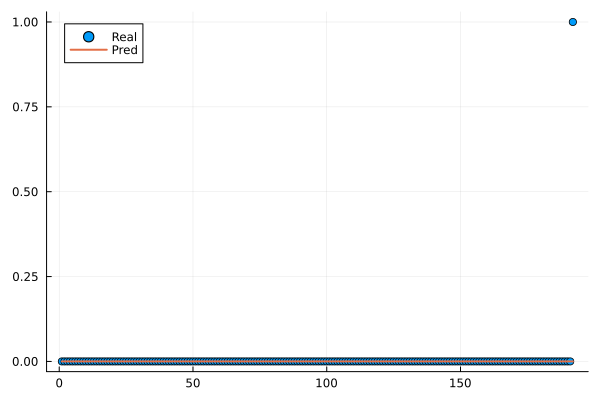

In [16]:
p1 = plot(
    t,
    y,
    seriestype = :scatter,
    label = "Real",
    markersize = 4
)

plot!(
    p1,
    t,
    pred_node,
    label = "Pred",
    linewidth = 2
)

p1

## UDE

Ahora además de tener un red neuronal en el sistema, agregamos un término físico a la ecuación diferencial.

$$
\frac{dz}{dt} = -\alpha z + NN(z, t)
$$

In [17]:
#Definimos la red
nn2 = Lux.Chain(
    Lux.Dense(2, 16, tanh),
    Lux.Dense(16, 1)
)

#parametros y estado interno
p_ude, st_ude = Lux.setup(rng, nn2)
p_ude = ComponentArray(p_ude)
    
α = 0.05

#definimos ude
function ude!(dz, z, p, t)

    input = [z[1], t]
    dz .= .-α .* z .+ nn2(input, p, st_ude)[1]

end

#definimos problema ode
prob_ude = ODEProblem(ude!, u0, tspan, p_ude)

#mismo proceso de antes
optf_ude = OptimizationFunction(
(x, _) -> loss(prob_ude,x,t,y),
AutoZygote()
)

optprob_ude = OptimizationProblem(optf_ude, p_ude)

result_ude = Optimization.solve(
    optprob_ude,
    Adam(0.01),
    maxiters=500
)

p_trained_ude = result_ude.u
pred_ude = predict(prob_ude, p_trained_ude, t)

192-element Vector{Float64}:
 4.5397868702434395e-5
 1.9857457265463165e-5
 1.0015235437388616e-5
 5.885035847926051e-6
 4.609551022899267e-6
 4.682053518466153e-6
 4.9441736964792406e-6
 5.2386940211093195e-6
 5.723246997615993e-6
 6.951122881420266e-6
 ⋮
 0.003781314753718315
 0.0037816006993591673
 0.0037818722578954037
 0.003782130645859085
 0.0037823770877325807
 0.003782612815910562
 0.0037828390706656496
 0.003783057100117729
 0.0037832681602071004

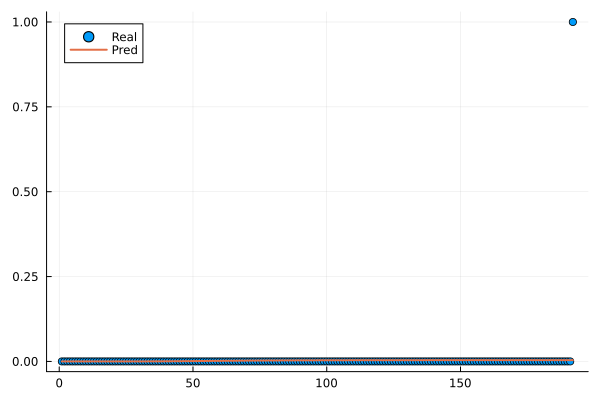

In [18]:
p1 = plot(
    t,
    y,
    seriestype = :scatter,
    label = "Real",
    markersize = 4
)

plot!(
    p1,
    t,
    pred_ude,
    label = "Pred",
    linewidth = 2
)

p1

Por ahora en los dos modelos que tenemos obtenemos un resultado constantemente 0. Veamos si al entrenar con más motores y agregar los sensores al modelo cambiamos esto.

##  UDE: sensores en el modelo y entrenamiento con más motores

A partir de ahora vamos a incorporar la información de sensores al sistema y entrenaremos con mas trayectorias.

$$
\frac{dz}{dt} = -\alpha z + NN(z,\tau,S(t))
$$

De esta parte en adelante vamos a realizar diferentes entrenamientos donde utilizamos una red neuronal y sus pesos. Para evitar utilizar pesos ya entrenados y hacerlo más limpio definimos la siguiente función:

In [20]:
function init_model(input_dim)

    nn = Lux.Chain(
        Lux.Dense(input_dim, 8, tanh),
        Lux.Dense(8, 1)
    )

    rng = MersenneTwister(1234)

    p, st = Lux.setup(rng, nn)

    return nn, ComponentArray(p), st
end

init_model (generic function with 1 method)

Definimos una función para partir los datos en train y test. Además podemos elegir los sensores que se utilizarán para el modelo.

In [21]:
function build_train_test_trajs_sensors(trajectories;n_motors=nothing,test_ratio=0.2,shuffle=false,sensors=nothing,seed=67)

    total_motors = length(trajectories)

    selected_ids = collect(1:total_motors)

    # shuffle opcional (solo para definir el orden base)
    if shuffle
        rng = MersenneTwister(seed)
        selected_ids = selected_ids[randperm(rng, length(selected_ids))]
    end

    # elegir subset de motores
    if n_motors !== nothing
        n = min(n_motors, total_motors)
        println("usando $n de $total_motors motores")
        selected_ids = selected_ids[1:n]
    end

    # split train/test (20% test, siguientes en la lista)
    n_test = Int(round(test_ratio * length(selected_ids)))
    test_ids = selected_ids[end - n_test + 1:end]
    train_ids = selected_ids[1:end - n_test]

    # default sensors
    if sensors === nothing
        sensors = 4:size(trajectories[1].X, 2)
    end

    # helper para construir dataset
    function build(ids)
        trajs = []

        for i in ids

            t = Float64.(trajectories[i].t)
            S = Float64.(trajectories[i].X[:, sensors])

            sensor_interps = [
                LinearInterpolation(S[:, j], t)
                for j in 1:size(S,2)
            ]

            push!(trajs,
                (
                    sensor_interps = sensor_interps,
                    sensors_ids = sensors,
                    t = t,
                    y = Float64.(trajectories[i].y)
                )
            )
        end

        return trajs
    end

    train_trajs = build(train_ids)
    test_trajs  = build(test_ids)

    return train_trajs, test_trajs
end

train_trajs, test_trajs = build_train_test_trajs_sensors(
    trajectories;
    n_motors=60,
    sensors = [6,7]
)

max_cycle_train = maximum(
    maximum(traj.t)
    for traj in train_trajs
)

287.0

In [22]:
function ude_sensors!(dz, z, p, τ, S)

    input = [z[1]; τ; S] 

    out, _ = nn2(input, p, st_ude_sensors)

    dz[1] = -α * z[1] + out[1]

end

ude_sensors! (generic function with 1 method)

In [23]:
function predict_traj_sensors(p, traj)

    tvec = traj.t
    y = traj.y

    z0 = [-10.0] #seguimos con eso...

    t0 = tvec[1]
    tf = tvec[end]
    tspan = (t0, tf)

    function f!(du, z, p, t)

        S = [
            interp(clamp(t, t0, tf))
            for interp in traj.sensor_interps
        ]

        τ = t / max_cycle_train

        ude_sensors!(du, z, p, τ, S)

    end

    prob = ODEProblem(f!, z0, tspan, p)

    sol = solve(
        prob,
        Tsit5(),
        saveat=tvec,
        abstol=1e-6,
        reltol=1e-6,
        dtmax=1.0
    )

    z_pred = Array(sol)[1, :]

    h_pred = σ.(z_pred)

    return h_pred

end

function loss_many_sensors(p, trajs)

    total_loss = 0f0
    total_points = 0
    pos_weight = 100f0 #le agrego peso en la loss al punto donde falla
    ϵ = 1f-7 #el epsilon es para no evaluar log(0)

    for traj in trajs
        h = predict_traj_sensors(p, traj)
        y = traj.y

        total_loss += -sum(pos_weight .* y .* log.(h .+ ϵ) .+ (1 .- y) .* log.(1 .- h .+ ϵ))
        total_points += length(y)
    end

    return total_loss / total_points

end

loss_many_sensors (generic function with 1 method)

Para la primera prueba tomamos sensores al azar

In [23]:
train_trajs, test_trajs = build_train_test_trajs_sensors(
    trajectories;
    n_motors=10,
    sensors = [6,7]
)
n_sensors = length(train_trajs[1].sensor_interps)

println("Cantidad de sensores usados: ", n_sensors)

input_dim = 2 + n_sensors

nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)

α = 0.05

0.05

Realizamos un entrenamiento por mini-batches

In [24]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 100
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================

p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors(
                p,
                batch
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors(
        p_current,
        train_trajs
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )



end

p_trained_ude_sensors = best_params

epoch=1 | batch_loss=1.077873 | train_loss=1.071912 | best=1.071912
epoch=2 | batch_loss=1.071912 | train_loss=1.066075 | best=1.066075
epoch=3 | batch_loss=1.066075 | train_loss=1.06036 | best=1.06036
epoch=4 | batch_loss=1.06036 | train_loss=1.054767 | best=1.054767
epoch=5 | batch_loss=1.054767 | train_loss=1.049296 | best=1.049296
epoch=6 | batch_loss=1.049296 | train_loss=1.043948 | best=1.043948
epoch=7 | batch_loss=1.043948 | train_loss=1.038716 | best=1.038716
epoch=8 | batch_loss=1.038716 | train_loss=1.033595 | best=1.033595
epoch=9 | batch_loss=1.033595 | train_loss=1.028593 | best=1.028593
epoch=10 | batch_loss=1.028593 | train_loss=1.023699 | best=1.023699
epoch=11 | batch_loss=1.023699 | train_loss=1.018914 | best=1.018914
epoch=12 | batch_loss=1.018914 | train_loss=1.014235 | best=1.014235
epoch=13 | batch_loss=1.014235 | train_loss=1.009663 | best=1.009663
epoch=14 | batch_loss=1.009663 | train_loss=1.005191 | best=1.005191
epoch=15 | batch_loss=1.005191 | train_loss=1.

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.90885675 -0.046994563 0.67484343 -0.7751515; -1.3041787 0.61972356 1.178824 -0.6089823; … ; 0.8954421 -1.3659446 -0.044181727 -1.0317854; 0.87426764 -0.7558566 -0.50799954 -0.75247204], bias = Float32[0.18187134, 0.4541871, -0.5227539, 0.01895338, -0.044129275, 0.32603884, 0.10761086, 0.20224017]), layer_2 = (weight = Float32[-0.12781225 -0.2666035 … 0.1012378 -0.15546778], bias = Float32[0.10728228]))

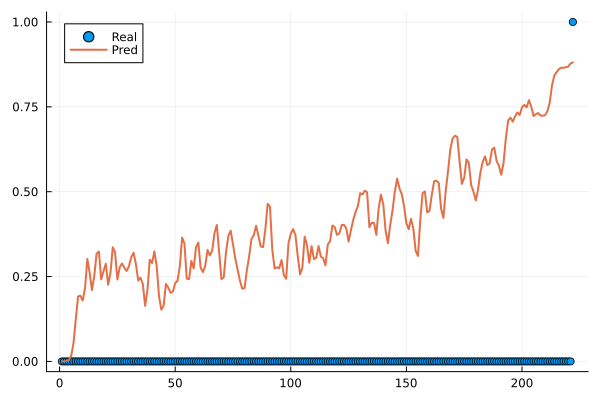

In [25]:
traj_plot = test_trajs[2]
t = traj_plot.t
y = traj_plot.y

pred_ude_sensors = predict_traj_sensors(
    p_trained_ude_sensors,
    traj_plot
)

p1 = plot(
    t,
    y,
    seriestype = :scatter,
    label = "Real",
    markersize = 4
)

plot!(
    p1,
    t,
    pred_ude_sensors,
    label = "Pred",
    linewidth = 2
)

p1

## Selección de Sensores

En el paso anterior incorporamos los sensores al sistema. Como tenemos muchos sensores, utilizarlos todos puede hacer que obtengamos un modelo muy pesado o también puede ser que repitamos información. Por lo tanto, vamos a llevar a cabo un proceso de **selección de sensores**.

Antes de eso vamos a generar la columna **RUL**(Remaining Useful Life) en nuestro data frame, que la vamos a utilzar en este proceso.

In [25]:
#Construimos el cilo de falla. En el train la falla se da en el último ciclo observado.
fail_cycles = combine(
    groupby(train_df, :unit),
    :cycle => maximum => :T_fail
)

#Obtenemos un df de la siguiente forma:
#unit    T_fail
#1       192

#Ahora mergeamos con el dataset original
train_df = leftjoin(train_df, fail_cycles, on=:unit)

#RUL = T_falla - Ciclo actual
train_df.RUL = train_df.T_fail .- train_df.cycle

20631-element Vector{Int64}:
 191
 190
 189
 188
 187
 186
 185
 184
 183
 182
   ⋮
   8
   7
   6
   5
   4
   3
   2
   1
   0

### 1. Estudiamos varianza de los sensores

In [26]:
variances = DataFrame(
    sensor = sensor_cols,
    variance = [
        var(train_df[!, col])
        for col in sensor_cols
    ]
)

sort!(variances, :variance, rev=true)

variances

Row,sensor,variance
,String,Float64
1,s18,NaN
2,s19,NaN
3,s6,1.0
4,s2,1.0
5,s17,1.0
6,s4,1.0
7,s8,1.0
8,s9,1.0
9,s11,1.0


Recordemos que al principio del trabajo normalizamos los datos de los sensores utilizando la transformación:

$$
\frac{x - \mu}{\sigma}
$$

Por lo tanto, observamos que:

- Dos sensores presentan $Var = NaN$. Esto ocurre debido a que $\sigma = 0$, es decir, el sensor toma un valor constante para todo instante de tiempo y, por lo tanto, no aporta información útil al modelo.

- Cuatro sensores presentan una varianza muy pequeña. En consecuencia, son sensores casi constantes y decidimos excluirlos del análisis.

- Los sensores restantes presentan $Var = 1$, lo cual es esperable luego del proceso de normalización. Estos sensores son los que superan el primer filtro de selección.

In [27]:
#Vamos a tener en cuenta los datos de los motores que vamos a usar para entrenar unicamente

train_units = unique(train_df.unit)[1:60]

train_df_subset = filter(
    row -> row.unit in train_units,
    train_df
)

#Definimos los sensores válidos hasta el momento:

valid_sensors = []

for col in sensor_cols

    σ_col = std(train_df[!, col])

    if !isnan(σ_col) && σ_col > 1e-8
        push!(valid_sensors, col)
    end
end

println(valid_sensors)

### 2. Correlación con RUL

La idea es identificar sensores cuyo comportamiento esté fuertemente asociado al proceso de degradación del motor.

Utilizamos el coeficiente de correlación de Pearson:

$$
\rho_{X,Y} = \frac{Cov(X,Y)}{\sigma_X \sigma_Y}
$$

Valores cercanos a:

- $1$ indican correlación positiva fuerte
- $-1$ indican correlación negativa fuerte
- $0$ indican ausencia de correlación lineal

In [28]:
correlations = DataFrame(
    sensor = valid_sensors,
    correlation = [
        cor(train_df[!, col], train_df.RUL)
        for col in valid_sensors
    ]
)

correlations.abs_corr = abs.(correlations.correlation)

sort!(correlations, :abs_corr, rev=true)

correlations

Row,sensor,correlation,abs_corr
,Any,Float64,Float64
1,s11,-0.696228,0.696228
2,s4,-0.678948,0.678948
3,s12,0.671983,0.671983
4,s7,0.657223,0.657223
5,s15,-0.642667,0.642667
6,s21,0.635662,0.635662
7,s20,0.629428,0.629428
8,s2,-0.606484,0.606484
9,s17,-0.606154,0.606154


### 3. Correlación entre sensores

Hasta ahora miramos la correlación entre los sensores y RUL. Si nos quedamos con los que maximicen esta cantidad puede pasar que seleccionemos sensores que estén muy correlacionados entre ellos. Entonces estudiaremos tambíen la correlación entre sensores:

In [29]:
sensor_corr = cor(Matrix(train_df[:, valid_sensors]))

sensor_corr_df = DataFrame(
    sensor_corr,
    Symbol.(valid_sensors)
)

sensor_corr_df

Row,s2,s3,s4,s6,s7,s8,s9,s11,s12,s13,s14,s15,s17,s20,s21
,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,1.0,0.60261,0.714949,0.132242,-0.702136,0.662325,0.273764,0.74002,-0.724578,0.661792,0.179752,0.675975,0.629886,-0.661841,-0.66805
2,0.60261,1.0,0.678413,0.116039,-0.664595,0.602481,0.322964,0.6959,-0.680307,0.600963,0.237137,0.639921,0.600017,-0.625941,-0.633901
3,0.714949,0.678413,1.0,0.15048,-0.79313,0.746852,0.297429,0.830136,-0.815591,0.745158,0.190748,0.758459,0.703499,-0.748067,-0.745193
4,0.132242,0.116039,0.15048,1.0,-0.15572,0.152161,0.0193472,0.160014,-0.155884,0.158276,-0.00211233,0.149042,0.13081,-0.141419,-0.137419
5,-0.702136,-0.664595,-0.79313,-0.15572,1.0,-0.767132,-0.217835,-0.822805,0.812713,-0.764611,-0.110053,-0.747051,-0.692893,0.736163,0.737447
6,0.662325,0.602481,0.746852,0.152161,-0.767132,1.0,-0.0320911,0.782213,-0.78654,0.826084,-0.144787,0.700949,0.627785,-0.68703,-0.68884
7,0.273764,0.322964,0.297429,0.0193472,-0.217835,-0.0320911,1.0,0.274591,-0.210238,-0.0347625,0.963157,0.293753,0.33711,-0.28528,-0.292795
8,0.74002,0.6959,0.830136,0.160014,-0.822805,0.782213,0.274591,1.0,-0.846884,0.780761,0.163408,0.780913,0.722296,-0.77151,-0.772554
9,-0.724578,-0.680307,-0.815591,-0.155884,0.812713,-0.78654,-0.210238,-0.846884,1.0,-0.788441,-0.0981405,-0.766052,-0.703485,0.751943,0.756263


Ahora realizaremos una selección greedy sin redundancia:
+ Ordenamos por correlación con RUL
+ Descartamos sensores muy correlacionados entre sí (si la correlación es mayor a 0.8 no lo utilizamos)

In [30]:
threshold = 0.8

selected_sensors = String[]

for sensor in correlations.sensor

    keep = true

    for selected in selected_sensors

        c = cor(
            train_df[:, sensor],
            train_df[:, selected]
        )

        if abs(c) > threshold
            keep = false
            break
        end
    end

    if keep
        push!(selected_sensors, sensor)
    end

    # nos quedamos con 5
    if length(selected_sensors) >= 5
        break
    end
end

Buscamos los índices de los sensores elegidos

In [31]:
feature_cols = vcat(setting_cols, sensor_cols)

sensor_indices = [
    findfirst(==(s), feature_cols)
    for s in selected_sensors
]

5-element Vector{Int64}:
 14
 18
 24
 23
  5

In [ ]:
for (s, idx) in zip(selected_sensors, sensor_indices)
    display( s)
    display( idx)
    
end


sensors_df = DataFrame(
    sensor = selected_sensors,
    index = sensor_indices
)

"s11"

14

"s15"

18

"s21"

24

"s20"

23

"s2"

5

Row,sensor,index
,String,Int64
1,s11,14
2,s15,18
3,s21,24
4,s20,23
5,s2,5


Luego de esto damos por finalizada la selección de sensores!

## UDE + mejores sensores

Ahora probamos el mismo modelo de antes pero utilizando los sensores seleccionados en la paso anterior.

In [29]:
train_trajs, test_trajs = build_train_test_trajs_sensors(
    trajectories;
    n_motors=10,
    sensors = sensor_indices
)
n_sensors = length(train_trajs[1].sensor_interps)

println("Cantidad de sensores usados: ", n_sensors)

input_dim = 2 + n_sensors

nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)

α = 0.05

0.05

In [35]:


# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 125
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================

p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors(
                p,
                batch
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors(
        p_current,
        train_trajs
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )

end

p_trained_ude_sensors = best_params

epoch=1 | batch_loss=0.57339 | train_loss=0.563787 | best=0.563787
epoch=2 | batch_loss=0.563787 | train_loss=0.556797 | best=0.556797
epoch=3 | batch_loss=0.556797 | train_loss=0.55076 | best=0.55076
epoch=4 | batch_loss=0.55076 | train_loss=0.545231 | best=0.545231
epoch=5 | batch_loss=0.545231 | train_loss=0.540018 | best=0.540018
epoch=6 | batch_loss=0.540018 | train_loss=0.535011 | best=0.535011
epoch=7 | batch_loss=0.535011 | train_loss=0.530135 | best=0.530135
epoch=8 | batch_loss=0.530135 | train_loss=0.525361 | best=0.525361
epoch=9 | batch_loss=0.525361 | train_loss=0.520664 | best=0.520664
epoch=10 | batch_loss=0.520664 | train_loss=0.516051 | best=0.516051
epoch=11 | batch_loss=0.516051 | train_loss=0.511548 | best=0.511548
epoch=12 | batch_loss=0.511548 | train_loss=0.507174 | best=0.507174
epoch=13 | batch_loss=0.507174 | train_loss=0.502923 | best=0.502923
epoch=14 | batch_loss=0.502923 | train_loss=0.498768 | best=0.498768
epoch=15 | batch_loss=0.498768 | train_loss=0.4

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.64269483 -0.16822137 … -0.37279803 0.693734; -1.1281724 0.440098 … -0.24201517 0.19994646; … ; 0.745535 -1.0185885 … 0.1773954 -0.5059472; 0.51191103 -0.57933074 … -0.13139988 0.8023823], bias = Float32[0.15443905, -0.10750107, 0.4157889, 0.16031927, -0.1977399, -0.025818577, -0.38565323, 0.23270804]), layer_2 = (weight = Float32[0.26444286 -0.094449714 … 0.49338272 -0.12388885], bias = Float32[0.060782097]))

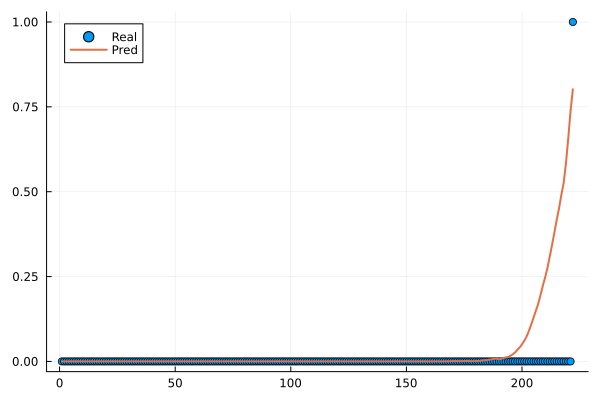

In [36]:
traj_plot = test_trajs[2]
t = traj_plot.t
y = traj_plot.y

pred_ude_sensors = predict_traj_sensors(
    p_trained_ude_sensors,
    traj_plot
)

p1 = plot(
    t,
    y,
    seriestype = :scatter,
    label = "Real",
    markersize = 4
)

plot!(
    p1,
    t,
    pred_ude_sensors,
    label = "Pred",
    linewidth = 2
)

p1

Se observa un curva más suave.

## Pesos ajustados en la función de pérdida:

Vamos a ajustar los pesos de cada término en la función de perdida. Nuestro objetivo es que el modelo penalice más el error del último punto que los que valen todos 0.

In [33]:

function loss_many_sensors_adj(p, trajs; b = 0.5, c = 1.0)

    total_loss = 0.0
    ϵ = 1f-7 #el epsilon es para no evaluar log(0)
    

    total_points= length(trajs) 
    for traj in trajs

        h = predict_traj_sensors(p, traj)
        h_event = h[end]
        h_survival = h[1:end-1]

        event_loss = -log(h_event + ϵ) #Alpha controla detectar correctamente la falla

        survival_loss = -mean(log.(1 .- h_survival .+ ϵ)) #Beta castiga los falsos positivos antes de la falla

        total_loss += c * event_loss + b * survival_loss

    end

    return total_loss / total_points

end

loss_many_sensors_adj (generic function with 1 method)

+ penalizar no subir en el evento final

+ penalizar subir antes de tiempo, en promedio


In [33]:
    train_trajs, test_trajs = build_train_test_trajs_sensors(
        trajectories;
        n_motors=10,
        sensors = sensor_indices
    )
    n_sensors = length(train_trajs[1].sensor_interps)

    println("Cantidad de sensores usados: ", n_sensors)

    input_dim = 2 + n_sensors

    nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)

    α = 0.05


0.05

In [34]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 125
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================

p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors_adj(
                p,
                batch,
                b = 0.5,
                c = 50
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors_adj(
        p_current,
        train_trajs,
        b = 0.5,
        c = 50
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )

end

p_trained_ude_sensors = best_params

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.67695725 -0.041880984 … -0.37709585 0.6681437; -1.0734148 0.37096587 … -0.3519006 0.3188036; … ; 0.7341036 -0.9673705 … 0.10718988 -0.46701708; 0.54179114 -0.7061214 … -0.14668883 0.80611575], bias = Float32[0.2771952, -0.18866773, 0.287252, 0.051702425, -0.22362004, -0.11534033, -0.37969875, 0.1083608]), layer_2 = (weight = Float32[0.35899377 -0.048976183 … 0.3605273 -0.20435184], bias = Float32[0.17389716]))

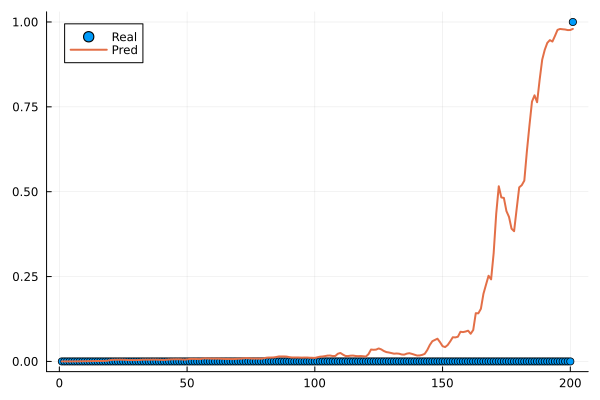

In [40]:
traj_plot = test_trajs[1]
t = traj_plot.t
y = traj_plot.y

pred_ude_sensors = predict_traj_sensors(
    p_trained_ude_sensors,
    traj_plot
)

p1 = plot(
    t,
    y,
    seriestype = :scatter,
    label = "Real",
    markersize = 4
)

plot!(
    p1,
    t,
    pred_ude_sensors,
    label = "Pred",
    linewidth = 2
)
p1

Al ajustar los pesos observamos que logramos que las curvas de predicción alcancen valores más altos.

# Horizontes

En la formulación original defininimos como positivo únicamente el ciclo exacto de falla:

$$
y_t^{\text{exact}}
=
\begin{cases}
1, & \text{si el motor falla exactamente en el ciclo } t,\\
0, & \text{en otro caso.}
\end{cases}
$$

Sin embargo, esta etiqueta genera un problema muy desbalanceado. Cada trayectoria tiene un único punto positivo y todos los demas negativos.

Por eso, definimos una etiqueta binaria con horizonte de falla \(H\). En este caso, la etiqueta vale 1 si el motor se encuentra a \(H\) ciclos o menos de fallar:

$$
y_t^{(H)}
=
\begin{cases}
1, & \text{si } RUL(t) \leq H,\\
0, & \text{si } RUL(t) > H.
\end{cases}
$$

Equivalente:

$$
y_t^{(H)}
=
\mathbf{1}\{RUL(t) \leq H\}.
$$


In [34]:
#Con esta función devolvemos trayectorias de train y test aplicando el método de horizontes
function build_train_test_trajs_sensors_horizon(
    trajectories;
    n_motors=nothing,
    test_ratio=0.2,
    shuffle=false,
    sensors=nothing,
    seed=67,
    H=0
)

    total_motors = length(trajectories)

    selected_ids = collect(1:total_motors)

    if shuffle
        rng = MersenneTwister(seed)
        selected_ids = selected_ids[randperm(rng, length(selected_ids))]
    end

    if n_motors !== nothing
        n = min(n_motors, total_motors)
        println("usando $n de $total_motors motores")
        selected_ids = selected_ids[1:n]
    end

    n_test = Int(round(test_ratio * length(selected_ids)))
    test_ids = selected_ids[end - n_test + 1:end]
    train_ids = selected_ids[1:end - n_test]

    if sensors === nothing
        sensors = 4:size(trajectories[1].X, 2)
    end

    function build(ids)
        trajs = []

        for i in ids

            t = Float64.(trajectories[i].t)
            S = Float64.(trajectories[i].X[:, sensors])

            sensor_interps = [
                LinearInterpolation(S[:, j], t)
                for j in 1:size(S, 2)
            ]

            RUL = t[end] .- t
            y_exact = Float64.(RUL .== 0)
            y_horizon = Float64.(RUL .<= H)

            push!(
                trajs,
                (
                    sensor_interps = sensor_interps,
                    sensors_ids = sensors,
                    t = t,
                    y = y_horizon,
                    y_exact = y_exact,
                    RUL = RUL,
                    H = H,
                    unit_id = i
                )
            )
        end

        return trajs
    end

    train_trajs = build(train_ids)
    test_trajs  = build(test_ids)

    return train_trajs, test_trajs
end

build_train_test_trajs_sensors_horizon (generic function with 1 method)

In [35]:
#la diferencia de esta función con loss_many_sensors es que podemos ajustar el peso...
function loss_many_sensors_horizon(p, trajs, pos_weight=100f0)

    total_loss = 0f0
    total_points = 0
    ϵ = 1f-7 #el epsilon es para no evaluar log(0)

    for traj in trajs
        h = predict_traj_sensors(p, traj)
        y = traj.y

        total_loss += -sum(pos_weight .* y .* log.(h .+ ϵ) .+ (1 .- y) .* log.(1 .- h .+ ϵ))
        total_points += length(y)
    end

    return total_loss / total_points

end

function compute_pos_weight(trajs)  #calcula el peso para la clase positiva basado en la proporción de positivos y negativos en las trayectorias

    total_positives = 0
    total_points = 0

    for traj in trajs
        total_positives += sum(traj.y)
        total_points += length(traj.y)
    end

    pos_weight = (total_points - total_positives) / (total_positives + 1e-7)

    return pos_weight
end

compute_pos_weight (generic function with 1 method)

In [36]:
H = 20

train_trajs, test_trajs = build_train_test_trajs_sensors_horizon(
    trajectories;
    n_motors=10,
    test_ratio=0.2,
    shuffle=false,
    sensors=sensor_indices,
    H=H
)

pos_weight = compute_pos_weight(train_trajs)

n_sensors = length(train_trajs[1].sensor_interps)

show("Cantidad de sensores usados: ")
show(n_sensors)

input_dim = 2 + n_sensors

nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)

α = 0.05


0.05

Primero vamos a probar el método de horizontes con el peso fijo.

In [44]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 125
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================

p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors(
                p,
                batch
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors(
        p_current,
        train_trajs
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )

end

p_trained_ude_sensors = best_params

epoch=1 | batch_loss=3.396178 | train_loss=3.321858 | best=3.321858
epoch=2 | batch_loss=3.321858 | train_loss=3.24882 | best=3.24882
epoch=3 | batch_loss=3.24882 | train_loss=3.176708 | best=3.176708
epoch=4 | batch_loss=3.176708 | train_loss=3.105548 | best=3.105548
epoch=5 | batch_loss=3.105548 | train_loss=3.035261 | best=3.035261
epoch=6 | batch_loss=3.035261 | train_loss=2.965822 | best=2.965822
epoch=7 | batch_loss=2.965822 | train_loss=2.897394 | best=2.897394
epoch=8 | batch_loss=2.897394 | train_loss=2.829855 | best=2.829855
epoch=9 | batch_loss=2.829855 | train_loss=2.763315 | best=2.763315
epoch=10 | batch_loss=2.763315 | train_loss=2.697688 | best=2.697688
epoch=11 | batch_loss=2.697688 | train_loss=2.633049 | best=2.633049
epoch=12 | batch_loss=2.633049 | train_loss=2.569394 | best=2.569394
epoch=13 | batch_loss=2.569394 | train_loss=2.506785 | best=2.506785
epoch=14 | batch_loss=2.506785 | train_loss=2.445186 | best=2.445186
epoch=15 | batch_loss=2.445186 | train_loss=2.

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.66990966 -0.0377592 … -0.3883998 0.67871016; -1.0585792 0.40934935 … -0.35328597 0.31970823; … ; 0.7080252 -1.0211009 … 0.12207585 -0.4773821; 0.53847384 -0.70740867 … -0.13941114 0.7991425], bias = Float32[0.26238972, -0.12528108, 0.3100797, 0.06487635, -0.18492365, -0.103880554, -0.4041282, 0.1250883]), layer_2 = (weight = Float32[0.37500483 -0.037145223 … 0.34520328 -0.18808278], bias = Float32[0.14275964]))

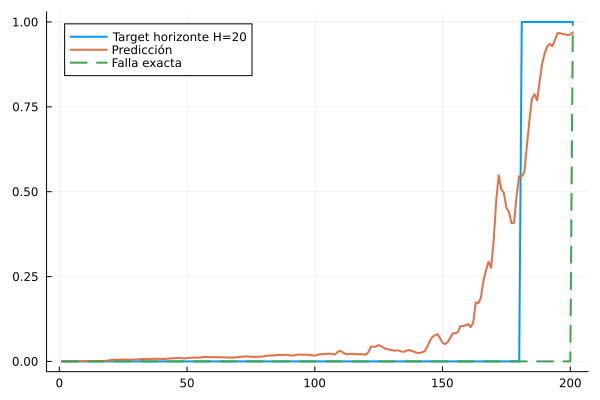

In [45]:
traj_plot = test_trajs[1]

pred = predict_traj_sensors(
    p_trained_ude_sensors,
    traj_plot
)

p = plot(
    traj_plot.t,
    traj_plot.y,
    label="Target horizonte H=$H",
    linewidth=2
)

plot!(
    p,
    traj_plot.t,
    pred,
    label="Predicción",
    linewidth=2
)

plot!(
    p,
    traj_plot.t,
    traj_plot.y_exact,
    label="Falla exacta",
    linewidth=2,
    linestyle=:dash
)

p

Ahora probamos los pesos ajustados

In [35]:
H = 20

train_trajs, test_trajs = build_train_test_trajs_sensors_horizon(
    trajectories;
    n_motors=10,
    test_ratio=0.2,
    shuffle=false,
    sensors=sensor_indices,
    H=H
)

pos_weight = compute_pos_weight(train_trajs)

n_sensors = length(train_trajs[1].sensor_interps)

show("Cantidad de sensores usados: ")
show(n_sensors)

input_dim = 2 + n_sensors

nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)

α = 0.05


0.05

In [47]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 125
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================

p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors_horizon(
                p,
                batch,
                pos_weight
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors_horizon(
        p_current,
        train_trajs,
        pos_weight
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )

end

p_trained_ude_sensors = best_params

epoch=1 | batch_loss=0.612976 | train_loss=0.601929 | best=0.601929
epoch=2 | batch_loss=0.601929 | train_loss=0.593482 | best=0.593482
epoch=3 | batch_loss=0.593482 | train_loss=0.586009 | best=0.586009
epoch=4 | batch_loss=0.586009 | train_loss=0.579074 | best=0.579074
epoch=5 | batch_loss=0.579074 | train_loss=0.572485 | best=0.572485
epoch=6 | batch_loss=0.572485 | train_loss=0.566152 | best=0.566152
epoch=7 | batch_loss=0.566152 | train_loss=0.560005 | best=0.560005
epoch=8 | batch_loss=0.560005 | train_loss=0.55401 | best=0.55401
epoch=9 | batch_loss=0.55401 | train_loss=0.548154 | best=0.548154
epoch=10 | batch_loss=0.548154 | train_loss=0.542458 | best=0.542458
epoch=11 | batch_loss=0.542458 | train_loss=0.536935 | best=0.536935
epoch=12 | batch_loss=0.536935 | train_loss=0.531589 | best=0.531589
epoch=13 | batch_loss=0.531589 | train_loss=0.526396 | best=0.526396
epoch=14 | batch_loss=0.526396 | train_loss=0.521328 | best=0.521328
epoch=15 | batch_loss=0.521328 | train_loss=0.

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.65356016 -0.011291913 … -0.38808987 0.68638426; -1.0858271 0.46072975 … -0.3076605 0.28126568; … ; 0.6696975 -1.055589 … 0.22258398 -0.547348; 0.5255836 -0.7010655 … -0.14453377 0.8028349], bias = Float32[0.13644978, -0.056437276, 0.427172, 0.19352357, -0.19396842, 0.011228669, -0.416575, 0.2727595]), layer_2 = (weight = Float32[0.28106648 -0.07064882 … 0.48802915 -0.1421802], bias = Float32[0.05753268]))

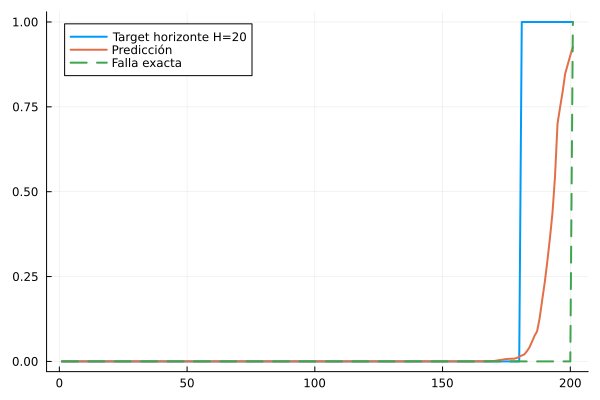

In [48]:
traj_plot = test_trajs[1]

pred = predict_traj_sensors(
    p_trained_ude_sensors,
    traj_plot
)

p = plot(
    traj_plot.t,
    traj_plot.y,
    label="Target horizonte H=$H",
    linewidth=2
)

plot!(
    p,
    traj_plot.t,
    pred,
    label="Predicción",
    linewidth=2
)

plot!(
    p,
    traj_plot.t,
    traj_plot.y_exact,
    label="Falla exacta",
    linewidth=2,
    linestyle=:dash
)

p

Se observa que al aplicar el método de horizontes obtenemos mejores resultados (a simple vista) que usando la variable objetivo exacta.

## Entrenamientos grandes

La idea de esta sección es probar diferentes modelos pero entrenando con más motores y testeando más. Para ello primero definimos algunas funciones que nos van a servir para comparar modelos:

+ failure_timing_df: con esta función devolvemos cuantos ciclos antes se detecta la falla o si no se llega a detectar en predicción con respecto a la trayectoria real.

+ failure_timing_df_gral: misma idea que la función de arriba pero hay que cambiar algunas cosas para usarla sin horizonte

+ compute_metrics: a partir de lo que devuelve failure_timing_df calculamos métricas como la media, mediana, varianza, etc.

+ result_df: creamos un dataframe donde vamos a comparar los resultados de los distintos modelos.

+ add_result: función para agregar resultados individuales al dataframe comparativo

+ guardar_predicciones: función para guardar predicciones

In [37]:
predicciones_modelos = Dict{String, Vector{Vector{Float64}}}()

function guardar_predicciones!(dic, nombre_modelo, test_trajs, p_trained, predict_fun)
    dic[nombre_modelo] = [
        predict_fun(p_trained, traj)
        for traj in test_trajs
    ]
end

guardar_predicciones! (generic function with 1 method)

In [38]:
function failure_timing_df(test_trajs, p_trained; threshold=1)

    results = DataFrame(
        motor = Int[],
        real_cycle = Int[],
        pred_cycle = Union{Missing, Int}[],
        diff_cycles = Union{Missing, Int}[]
    )

    for (i, traj) in enumerate(test_trajs)

        pred = predict_traj_sensors(
            p_trained,
            traj
        )

        # ciclo real de falla
        idx_real = findfirst(==(1), traj.y_exact)

        real_cycle =
            isnothing(idx_real) ? missing :
            Int(traj.t[idx_real])

        # primer instante donde la predicción supera el umbral
        idx_pred = findfirst(>=(threshold), pred)

        pred_cycle =
            isnothing(idx_pred) ? missing :
            Int(traj.t[idx_pred])

        diff =
            ismissing(real_cycle) || ismissing(pred_cycle) ?
            missing :
            pred_cycle - real_cycle

        push!(
            results,
            (
                i,
                real_cycle,
                pred_cycle,
                diff
            )
        )

    end

    return results

end

function failure_timing_df_gral(test_trajs, p_trained; threshold=0.5)

    results = DataFrame(
        motor = Int[],
        real_cycle = Union{Missing, Int}[],
        pred_cycle = Union{Missing, Int}[],
        diff_cycles = Union{Missing, Int}[]
    )

    for (i, traj) in enumerate(test_trajs)

        pred = predict_traj_sensors(p_trained, traj)

        # Caso exacto: y tiene un único 1 en el ciclo real de falla.
        idx_real = findfirst(==(1.0), traj.y)

        real_cycle =
            isnothing(idx_real) ? missing :
            Int(traj.t[idx_real])

        # Primer ciclo en el que la predicción supera el umbral.
        idx_pred = findfirst(x -> x >= threshold, pred)

        pred_cycle =
            isnothing(idx_pred) ? missing :
            Int(traj.t[idx_pred])

        diff =
            ismissing(real_cycle) || ismissing(pred_cycle) ?
            missing :
            pred_cycle - real_cycle

        push!(
            results,
            (
                i,
                real_cycle,
                pred_cycle,
                diff
            )
        )

    end

    return results

end

function failure_timing_df_lambda(test_trajs, p_trained; threshold=1)

    results = DataFrame(
        motor = Int[],
        real_cycle = Int[],
        pred_cycle = Union{Missing, Int}[],
        diff_cycles = Union{Missing, Int}[]
    )

    for (i, traj) in enumerate(test_trajs)

        pred = predict_traj_sensors_lambda(
            p_trained,
            traj
        )

        # ciclo real de falla
        idx_real = findfirst(==(1), traj.y_exact)

        real_cycle =
            isnothing(idx_real) ? missing :
            Int(traj.t[idx_real])

        # primer instante donde la predicción supera el umbral
        idx_pred = findfirst(>=(threshold), pred)

        pred_cycle =
            isnothing(idx_pred) ? missing :
            Int(traj.t[idx_pred])

        diff =
            ismissing(real_cycle) || ismissing(pred_cycle) ?
            missing :
            pred_cycle - real_cycle

        push!(
            results,
            (
                i,
                real_cycle,
                pred_cycle,
                diff
            )
        )

    end

    return results

end

function compute_metrics(df_eval)

    diffs = collect(skipmissing(df_eval.diff_cycles))

    n_total = nrow(df_eval)
    n_detected = length(diffs)
    n_missing = n_total - n_detected

    if isempty(diffs)
        return (
            mean_error = missing,
            median_error = missing,
            std_error = missing,
            mae = missing,
            rmse = missing,
            early_rate = missing,
            late_rate = missing,
            exact_rate = missing,
            detection_rate = 0.0,
            missing_rate = 1.0
        )
    end

    mean_error = mean(diffs)
    median_error = median(diffs)
    std_error = length(diffs) > 1 ? std(diffs) : 0.0

    mae = mean(abs.(diffs))
    rmse = sqrt(mean(diffs .^ 2))

    early_rate = mean(diffs .< 0)
    late_rate = mean(diffs .> 0)
    exact_rate = mean(diffs .== 0)

    detection_rate = n_detected / n_total
    missing_rate = n_missing / n_total

    return (
        mean_error = mean_error,
        median_error = median_error,
        std_error = std_error,
        mae = mae,
        rmse = rmse,
        early_rate = early_rate,
        late_rate = late_rate,
        exact_rate = exact_rate,
        detection_rate = detection_rate,
        missing_rate = missing_rate
    )

end



results_df = DataFrame(
    model_name = String[],
    mean_error = Union{Missing, Float64}[],
    median_error = Union{Missing, Float64}[],
    std_error = Union{Missing, Float64}[],
    mae = Union{Missing, Float64}[],
    rmse = Union{Missing, Float64}[],
    early_rate = Union{Missing, Float64}[],
    late_rate = Union{Missing, Float64}[],
    exact_rate = Union{Missing, Float64}[],
    detection_rate = Float64[],
    missing_rate = Float64[]
)



function add_result!(results_df, model_name, df_eval)

    m = compute_metrics(df_eval)

    push!(
        results_df,
        (
            model_name,
            m.mean_error,
            m.median_error,
            m.std_error,
            m.mae,
            m.rmse,
            m.early_rate,
            m.late_rate,
            m.exact_rate,
            m.detection_rate,
            m.missing_rate
        )
    )

end

add_result! (generic function with 1 method)

## <u>UDE</u>:

$$
\frac{dz}{dt} = -\alpha z + NN(z,\tau,S(t))
$$


### Método Horizonte

In [51]:
H = 20

train_trajs, test_trajs = build_train_test_trajs_sensors_horizon(
    trajectories;
    n_motors=60,
    test_ratio=0.2,
    shuffle=false,
    sensors=sensor_indices,
    H=H
)

pos_weight = compute_pos_weight(train_trajs)

n_sensors = length(train_trajs[1].sensor_interps)

show("Cantidad de sensores usados: ")
show(n_sensors)

input_dim = 2 + n_sensors

nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)

α = 0.05


usando 60 de 100 motores
"Cantidad de sensores usados: "5

0.05

In [52]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 125
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================

p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors_horizon(
                p,
                batch,
                pos_weight
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors_horizon(
        p_current,
        train_trajs,
        pos_weight
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )

end

p_trained_ude_sensors = best_params

epoch=1 | batch_loss=0.672253 | train_loss=0.642193 | best=0.642193
epoch=2 | batch_loss=0.630187 | train_loss=0.609293 | best=0.609293
epoch=3 | batch_loss=0.597206 | train_loss=0.578985 | best=0.578985
epoch=4 | batch_loss=0.570784 | train_loss=0.549324 | best=0.549324
epoch=5 | batch_loss=0.542442 | train_loss=0.520656 | best=0.520656
epoch=6 | batch_loss=0.508124 | train_loss=0.492552 | best=0.492552
epoch=7 | batch_loss=0.547325 | train_loss=0.467323 | best=0.467323
epoch=8 | batch_loss=0.463463 | train_loss=0.455026 | best=0.455026
epoch=9 | batch_loss=0.449843 | train_loss=0.441886 | best=0.441886
epoch=10 | batch_loss=0.438394 | train_loss=0.426556 | best=0.426556
epoch=11 | batch_loss=0.421423 | train_loss=0.410346 | best=0.410346
epoch=12 | batch_loss=0.403012 | train_loss=0.39488 | best=0.39488
epoch=13 | batch_loss=0.391348 | train_loss=0.379914 | best=0.379914
epoch=14 | batch_loss=0.377478 | train_loss=0.367545 | best=0.367545
epoch=15 | batch_loss=0.368768 | train_loss=0

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.58964205 -0.14411026 … -0.39328805 0.7824746; -0.9711344 0.44681185 … -0.308445 0.21168739; … ; 0.68440205 -1.1172729 … 0.24673519 -0.61696553; 0.35528758 -0.5919564 … -0.13210358 0.7331009], bias = Float32[0.037482467, 0.056549054, 0.51069045, 0.28404248, -0.062013816, 0.11137813, -0.4608451, 0.414903]), layer_2 = (weight = Float32[0.30501744 -0.08635009 … 0.5472828 -0.25077632], bias = Float32[0.018746158]))

+ Graficamos para todos los motores de Test

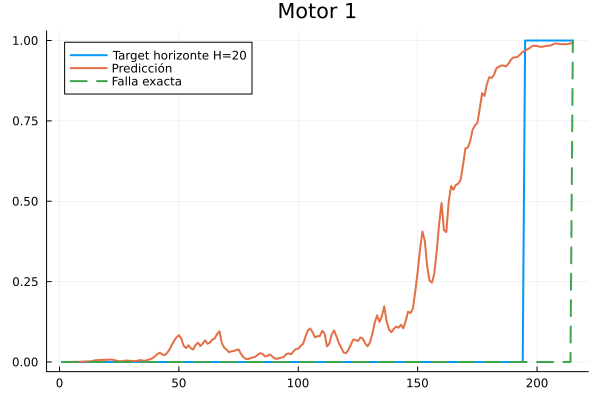

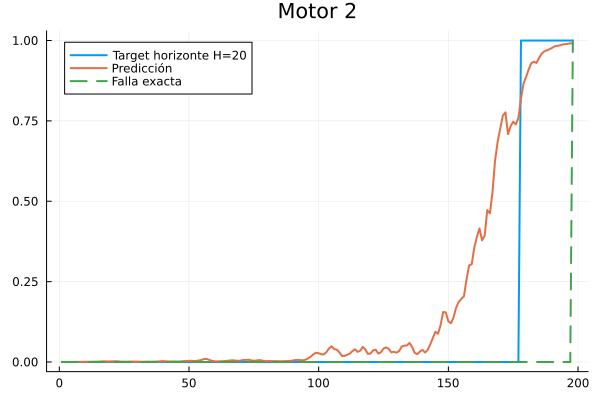

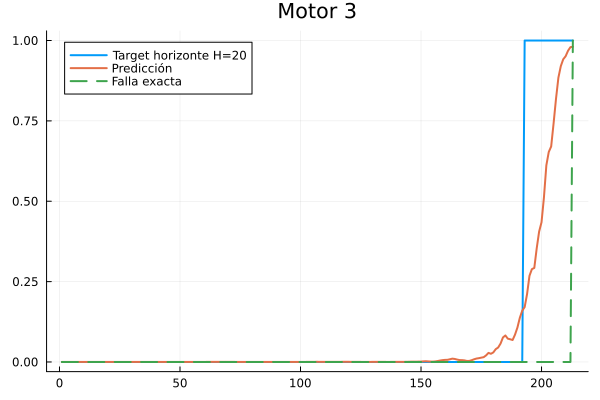

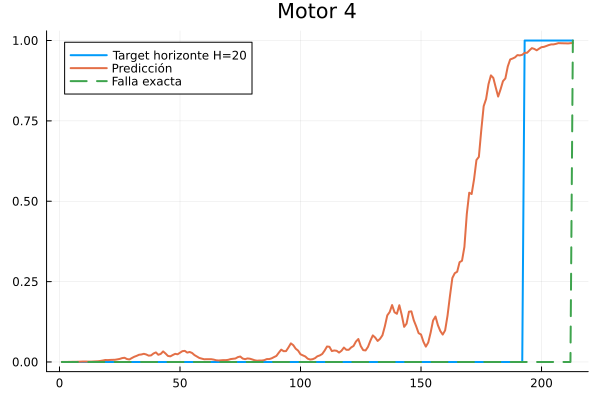

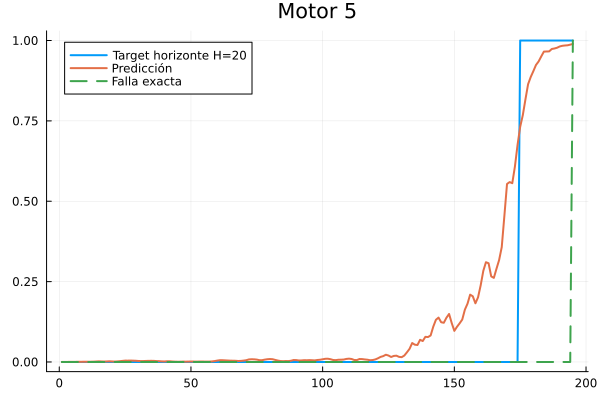

...

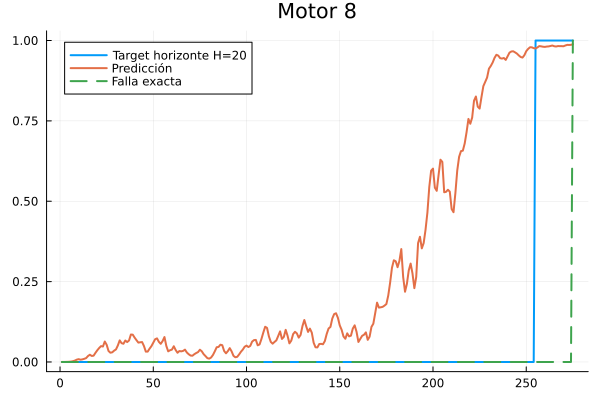

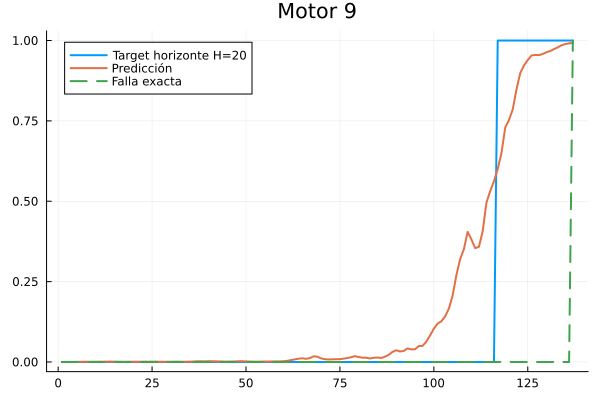

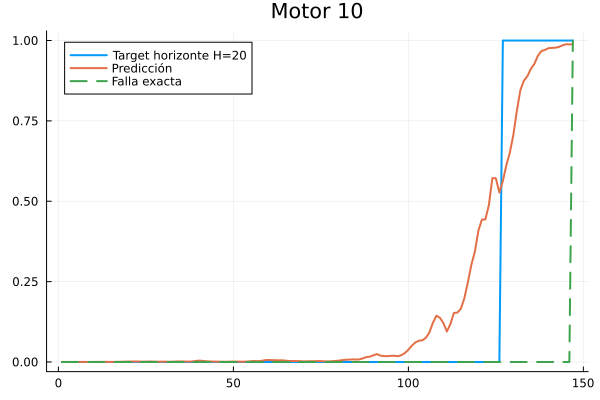

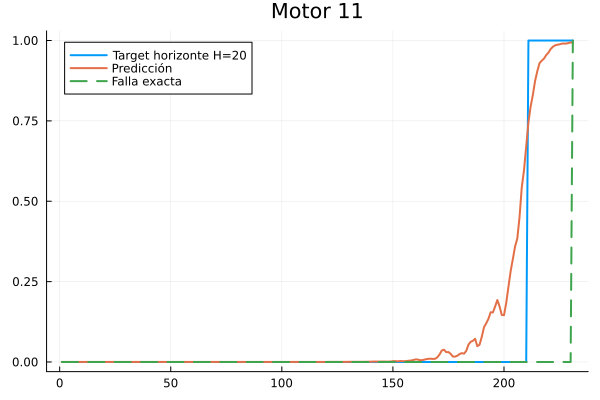

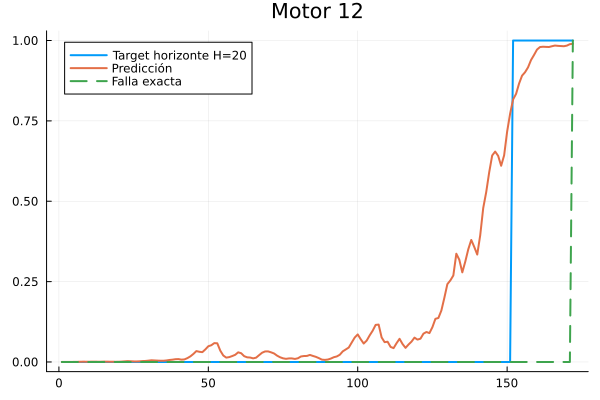

In [53]:
for (i, traj_plot) in enumerate(test_trajs)

    pred = predict_traj_sensors(
        p_trained_ude_sensors,
        traj_plot
    )

    p = plot(
        traj_plot.t,
        traj_plot.y,
        label = "Target horizonte H=$H",
        linewidth = 2,
        title = "Motor $i"
    )

    plot!(
        p,
        traj_plot.t,
        pred,
        label = "Predicción",
        linewidth = 2
    )

    plot!(
        p,
        traj_plot.t,
        traj_plot.y_exact,
        label = "Falla exacta",
        linewidth = 2,
        linestyle = :dash
    )

    display(p)

end

Vamos a estudiar cuánto se anticipan o tardan las predicciones en llegar a la falla.

In [54]:
df_eval = failure_timing_df(
    test_trajs,
    p_trained_ude_sensors;
    threshold=0.989
)

df_eval

Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64,Int64?,Int64?
1,1,215,207,-8
2,2,198,196,-2
3,3,213,missing,missing
4,4,213,206,-7
5,5,195,195,0
6,6,257,missing,missing
7,7,193,190,-3
8,8,275,missing,missing
9,9,137,135,-2


+ Agregamos resultados

In [55]:
add_result!(
    results_df,
    "UDE_horizon",
    df_eval
)

Row,model_name,mean_error,median_error,std_error,mae,rmse,early_rate,late_rate,exact_rate,detection_rate,missing_rate
,String,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64,Float64
1,UDE_horizon,-3.375,-2.5,3.02076,3.375,4.4017,0.75,0.0,0.25,0.666667,0.333333


In [56]:
guardar_predicciones!(
    predicciones_modelos,
    "UDE horizonte",
    test_trajs,
    p_trained_ude_sensors,
    predict_traj_sensors
)

12-element Vector{Vector{Float64}}:
 [4.5397868702434395e-5, 9.648929683918762e-5, 0.00018149327007801788, 0.00022206623641497176, 0.0003122374307197704, 0.00048702428563011707, 0.0005526540903191229, 0.0005486249369144023, 0.0007587063140776682, 0.0013037920429426902  …  0.9854452686588397, 0.9895181014434301, 0.9908135387763668, 0.9896883558293215, 0.9886128280231538, 0.9889490107975921, 0.9882350371211863, 0.9893079052122628, 0.9907470853444297, 0.9922094437665161]
 [4.5397868702434395e-5, 7.190688376195461e-5, 8.135798647974082e-5, 0.00010979701145583721, 0.000174945347023316, 0.0002484658355117626, 0.0002631256040552087, 0.00033538248098983087, 0.00046192431421709224, 0.0004839154480611979  …  0.973091523175159, 0.9771175088663087, 0.982110113657913, 0.983297199361222, 0.9847322448116402, 0.987552493171613, 0.9887111512320973, 0.9896118750235634, 0.9912138287248079, 0.990802842500435]
 [4.5397868702434395e-5, 4.8069569998172566e-5, 4.460460517390887e-5, 3.906054608469919e-5, 3.912

### Variable objetivo exacta (sin horizonte)

In [57]:

train_trajs, test_trajs = build_train_test_trajs_sensors(
    trajectories;
    n_motors=60,
    test_ratio=0.2,
    shuffle=false,
    sensors=sensor_indices,
)


n_sensors = length(train_trajs[1].sensor_interps)

show("Cantidad de sensores usados: ")
show(n_sensors)

input_dim = 2 + n_sensors

nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)

α = 0.05



usando 60 de 100 motores
"Cantidad de sensores usados: "5

0.05

In [58]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 125
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================

p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors_adj(
                p,
                batch,
                b = 1,
                c = 70 
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors_adj(
        p_current,
        train_trajs,
        b = 1,
        c = 70
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )

end

p_trained_ude_sensors = best_params


epoch=1 | batch_loss=17.980398 | train_loss=16.08047 | best=16.08047
epoch=2 | batch_loss=14.821178 | train_loss=13.112573 | best=13.112573
epoch=3 | batch_loss=12.007793 | train_loss=10.532464 | best=10.532464
epoch=4 | batch_loss=9.491208 | train_loss=8.319299 | best=8.319299
epoch=5 | batch_loss=7.593459 | train_loss=6.491763 | best=6.491763
epoch=6 | batch_loss=5.849396 | train_loss=5.094658 | best=5.094658
epoch=7 | batch_loss=4.672138 | train_loss=4.366599 | best=4.366599
epoch=8 | batch_loss=4.170606 | train_loss=3.909667 | best=3.909667
epoch=9 | batch_loss=3.743617 | train_loss=3.554562 | best=3.554562
epoch=10 | batch_loss=3.429344 | train_loss=3.264862 | best=3.264862
epoch=11 | batch_loss=3.157873 | train_loss=3.037107 | best=3.037107
epoch=12 | batch_loss=2.949311 | train_loss=2.818006 | best=2.818006
epoch=13 | batch_loss=2.713324 | train_loss=2.609716 | best=2.609716
epoch=14 | batch_loss=2.546129 | train_loss=2.486384 | best=2.486384
epoch=15 | batch_loss=2.442075 | tra

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.6001377 -0.032861065 … -0.4142041 0.7122257; -0.9663487 0.638829 … -0.39661515 0.35722005; … ; 0.7626378 -0.9896107 … -0.059904087 -0.27642986; 0.48704714 -0.69898903 … -0.1280739 0.78726846], bias = Float32[0.21970738, 0.28811595, 0.37834612, 0.12601978, 0.1113023, -0.107385986, -0.49887222, 0.17634454]), layer_2 = (weight = Float32[0.35437524 -0.097059116 … 0.3620556 -0.1528355], bias = Float32[0.087462634]))

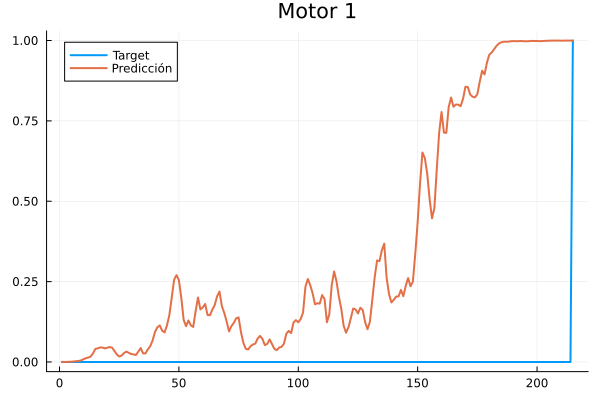

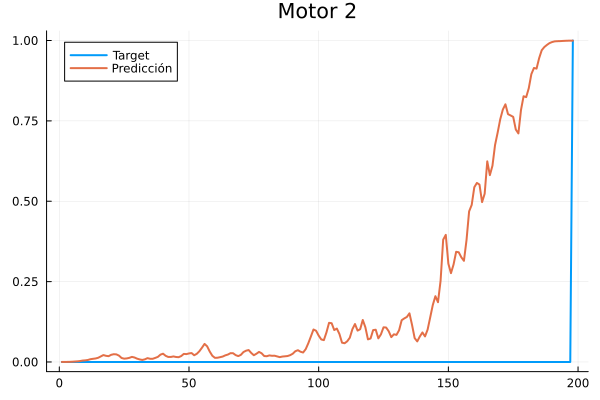

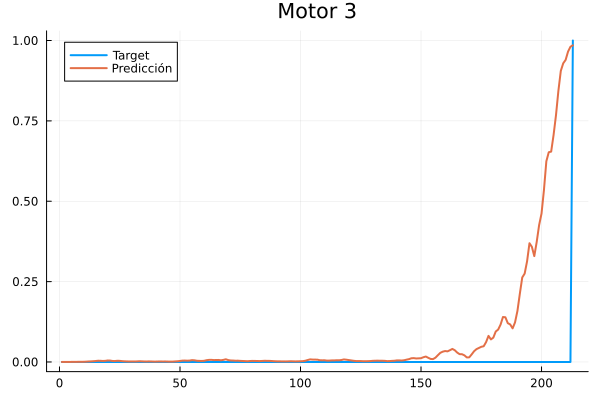

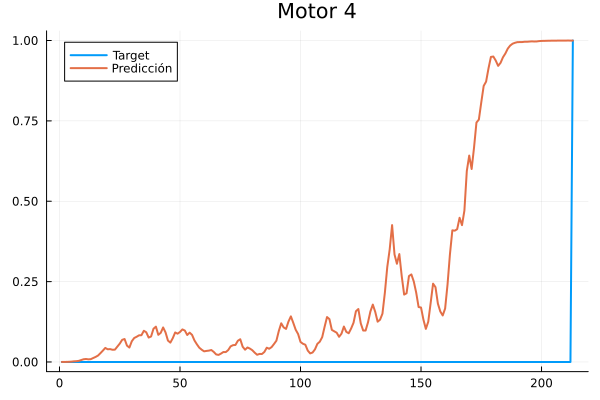

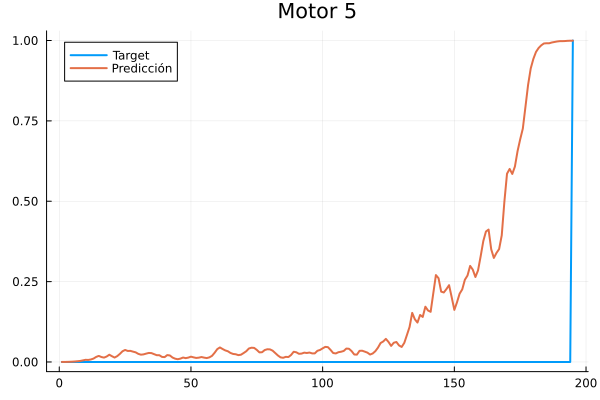

...

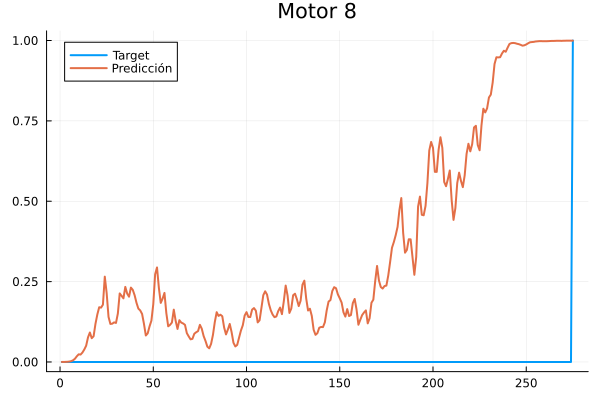

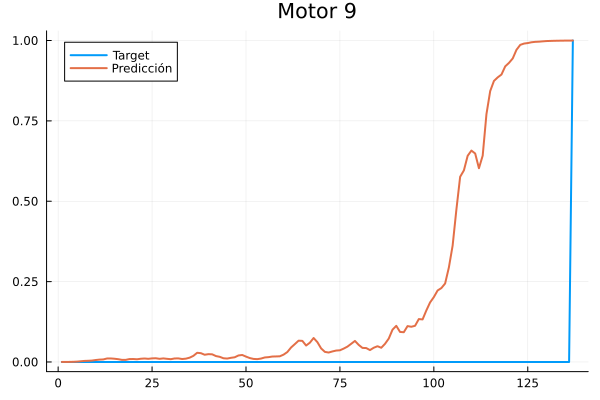

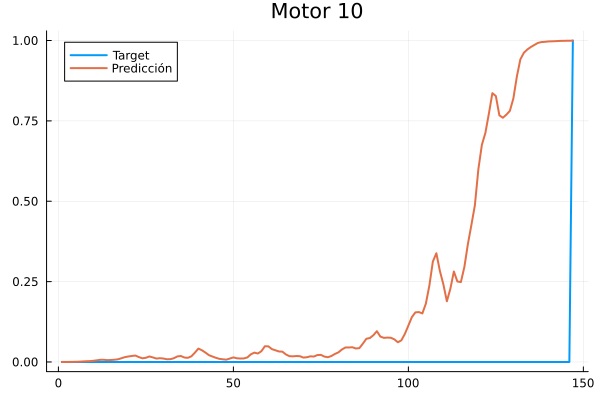

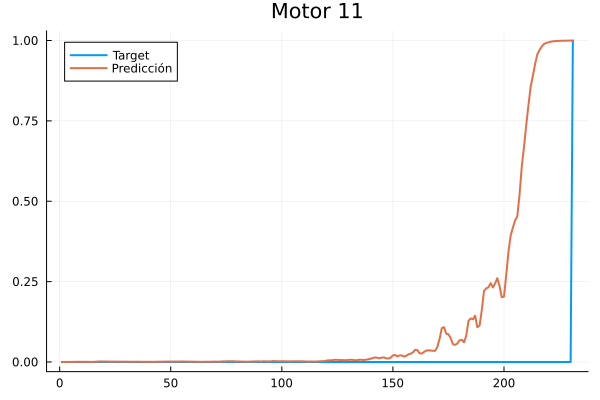

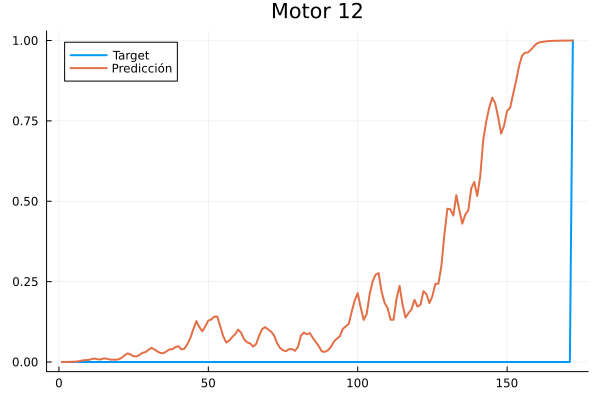

In [59]:
for (i, traj_plot) in enumerate(test_trajs)

    pred = predict_traj_sensors(
        p_trained_ude_sensors,
        traj_plot
    )

    p = plot(
        traj_plot.t,
        traj_plot.y,
        label = "Target",
        linewidth = 2,
        title = "Motor $i"
    )

    plot!(
        p,
        traj_plot.t,
        pred,
        label = "Predicción",
        linewidth = 2
    )

    display(p)

end

In [60]:
df_eval = failure_timing_df_gral(
    test_trajs,
    p_trained_ude_sensors;
    threshold=0.989
)

df_eval

Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64?,Int64?,Int64?
1,1,215,184,-31
2,2,198,189,-9
3,3,213,missing,missing
4,4,213,188,-25
5,5,195,184,-11
6,6,257,251,-6
7,7,193,186,-7
8,8,275,241,-34
9,9,137,124,-13


Agregamos resultados

In [61]:
add_result!(
    results_df,
    "UDE_exacto",
    df_eval
)

results_df

Row,model_name,mean_error,median_error,std_error,mae,rmse,early_rate,late_rate,exact_rate,detection_rate,missing_rate
,String,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64,Float64
1,UDE_horizon,-3.375,-2.5,3.02076,3.375,4.4017,0.75,0.0,0.25,0.666667,0.333333
2,UDE_exacto,-15.4545,-12.0,9.79146,15.4545,18.0555,1.0,0.0,0.0,0.916667,0.0833333


In [62]:
guardar_predicciones!(
    predicciones_modelos,
    "UDE exacta",
    test_trajs,
    p_trained_ude_sensors,
    predict_traj_sensors
)

12-element Vector{Vector{Float64}}:
 [4.5397868702434395e-5, 0.00011302140116884326, 0.0002606259739956861, 0.0004640325634527697, 0.000846852913181911, 0.0016395428004015672, 0.002483630203469631, 0.00304934408154017, 0.004778999148081809, 0.008399975996238285  …  0.9996497376059599, 0.9997306390383502, 0.9997595204157904, 0.9997061578672999, 0.9995556749536958, 0.9996015257961541, 0.9996613319287029, 0.9997127569085235, 0.9997643399304429, 0.9997472853580894]
 [4.5397868702434395e-5, 0.00010692754007672416, 0.00020587712433192535, 0.0004032075571080196, 0.0008044161435346617, 0.0014321661021742473, 0.0019246126583690214, 0.0028801473766717507, 0.004380409936868389, 0.0050226904888270385  …  0.9919485643522048, 0.9952612568809761, 0.9973333687323879, 0.997904793174985, 0.9980873751498569, 0.9986300528083273, 0.999069212545586, 0.9993841794615945, 0.9995475071743678, 0.9995325701004468]
 [4.5397868702434395e-5, 8.924637134365189e-5, 0.0001253828147282505, 0.00015216123495814744, 0.0002

### $\alpha$ entrenable (positivo)

In [ ]:
train_trajs, test_trajs = build_train_test_trajs_sensors_horizon(
    trajectories;
    n_motors=60,
    test_ratio=0.2,
    shuffle=false,
    sensors=sensor_indices,
    H=H
)

# ==========================================
# Inicialización modelo con α entrenable
# ==========================================

nn2, p_nn, st_ude_sensors = init_model(input_dim)

λ0 = 0.05f0

p_ude_sensors = ComponentArray(
    nn = p_nn,
    logλ = log(λ0)
)

usando 60 de 100 motores


ComponentVector{Float32}(nn = (layer_1 = (weight = Float32[-0.7408691 -0.10326696 … -0.31419405 0.60451025; -1.0432168 0.3961915 … -0.37899157 0.34615695; … ; 0.71916956 -0.96607554 … 0.13166444 -0.49240565; 0.6046512 -0.64713013 … -0.20698707 0.8680423], bias = Float32[0.22285166, -0.17147908, 0.34149525, 0.09755093, -0.2741171, -0.075842164, -0.33706185, 0.16103292]), layer_2 = (weight = Float32[0.32925278 0.0061875214 … 0.4209173 -0.17584868], bias = Float32[0.12733962])), logλ = -2.9957323f0)

In [64]:
function ude_sensors_lambda!(dz, z, p, τ, S)

    input = [z[1]; τ; S]

    out, _ = nn2(input, p.nn, st_ude_sensors)

    λ = exp(p.logλ)

    dz[1] = -λ * z[1] + out[1]

end

function predict_traj_sensors_lambda(p, traj)

    tvec = traj.t
    y = traj.y

    z0 = [-10.0] #seguimos con eso...

    t0 = tvec[1]
    tf = tvec[end]
    tspan = (t0, tf)

    function f!(du, z, p, t)

        S = [
            interp(clamp(t, t0, tf))
            for interp in traj.sensor_interps
        ]

        τ = t / max_cycle_train

        ude_sensors_lambda!(du, z, p, τ, S)

    end

    prob = ODEProblem(f!, z0, tspan, p)

    sol = solve(
        prob,
        Tsit5(),
        saveat=tvec,
        abstol=1e-6,
        reltol=1e-6,
        dtmax=1.0
    )

    z_pred = Array(sol)[1, :]

    h_pred = σ.(z_pred)

    return h_pred

end

function loss_many_sensors_horizon_lambda(
    p,
    trajs;
    pos_weight = 1.0f0,
    ϵ = 1f-7
)

    total_loss = 0.0
    total_points = 0

    for traj in trajs

        h = predict_traj_sensors_lambda(p, traj)
        y = traj.y

        total_loss += -sum(
            pos_weight .* y .* log.(h .+ ϵ) .+
            (1 .- y) .* log.(1 .- h .+ ϵ)
        )

        total_points += length(y)

    end

    return total_loss / total_points

end


loss_many_sensors_horizon_lambda (generic function with 1 method)

In [65]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 125
lr = 1e-3


pos_weight_base = compute_pos_weight(train_trajs)
pos_weight_train = 1.0f0 * pos_weight_base

# ==========================================
# Inicialización
# ==========================================

p0 = deepcopy(p_ude_sensors)
p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors_horizon_lambda(
                p,
                batch;
                pos_weight = pos_weight_train
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors_horizon_lambda(
        p_current,
        train_trajs;
        pos_weight = pos_weight_train
    )

    if train_loss < best_loss
        best_loss = train_loss
        best_params = deepcopy(p_current)
    end

    λ_current = exp(p_current.logλ)

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6)) | " *
        "λ=$(round(λ_current, digits=6))"
    )
    flush(stdout)

end

p_trained_ude_sensors = best_params

println("λ inicial = ", λ0)
println("λ aprendido = ", exp(p_trained_ude_sensors.logλ))

epoch=1 | batch_loss=0.670369 | train_loss=0.641667 | best=0.641667 | λ=0.049735
epoch=2 | batch_loss=0.631832 | train_loss=0.608181 | best=0.608181 | λ=0.049515
epoch=3 | batch_loss=0.600174 | train_loss=0.577307 | best=0.577307 | λ=0.049305
epoch=4 | batch_loss=0.569243 | train_loss=0.547915 | best=0.547915 | λ=0.049099
epoch=5 | batch_loss=0.534181 | train_loss=0.519651 | best=0.519651 | λ=0.048897
epoch=6 | batch_loss=0.510549 | train_loss=0.493107 | best=0.493107 | λ=0.048703
epoch=7 | batch_loss=0.548006 | train_loss=0.469426 | best=0.469426 | λ=0.048582
epoch=8 | batch_loss=0.46243 | train_loss=0.455443 | best=0.455443 | λ=0.048576
epoch=9 | batch_loss=0.452346 | train_loss=0.439968 | best=0.439968 | λ=0.048515
epoch=10 | batch_loss=0.434233 | train_loss=0.423 | best=0.423 | λ=0.048417
epoch=11 | batch_loss=0.416661 | train_loss=0.405232 | best=0.405232 | λ=0.048295
epoch=12 | batch_loss=0.397924 | train_loss=0.3884 | best=0.3884 | λ=0.048162
epoch=13 | batch_loss=0.384887 | tra

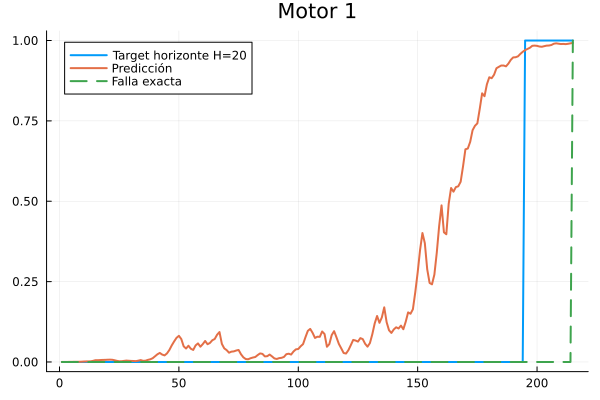

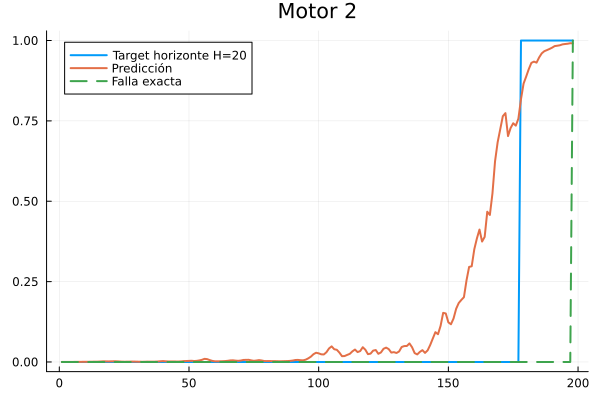

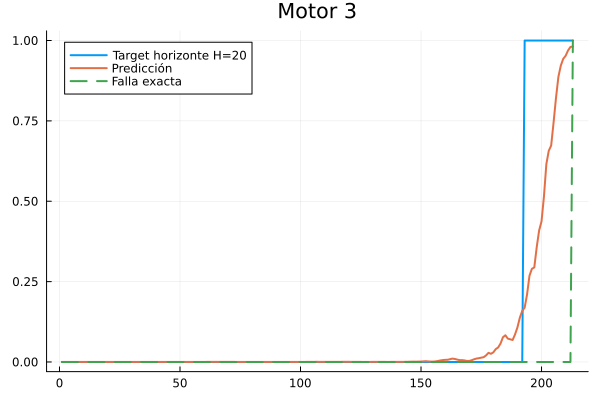

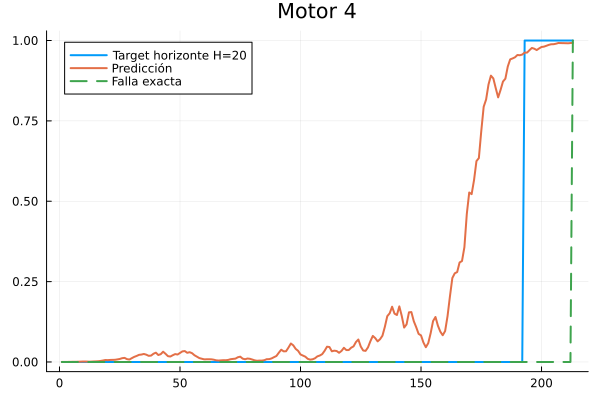

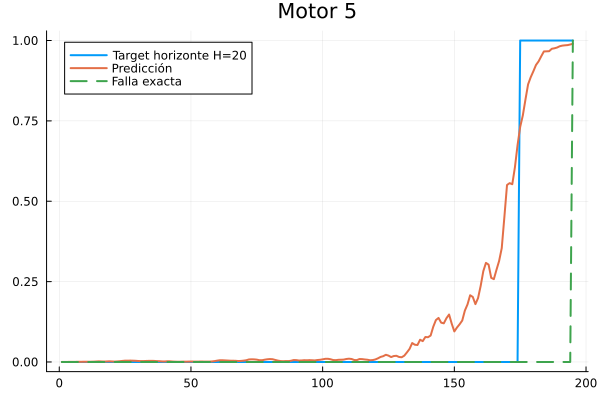

...

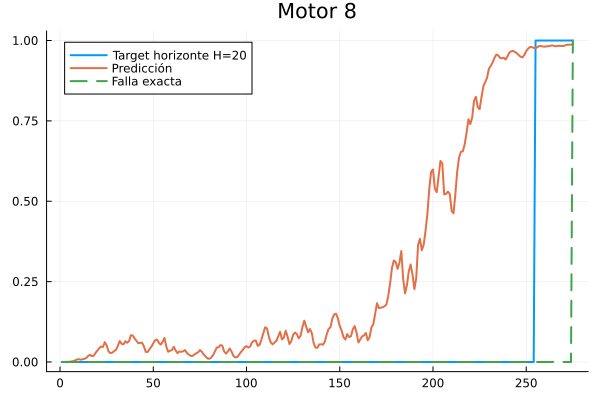

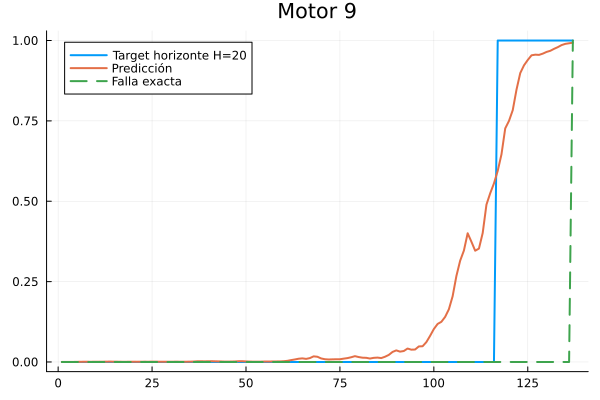

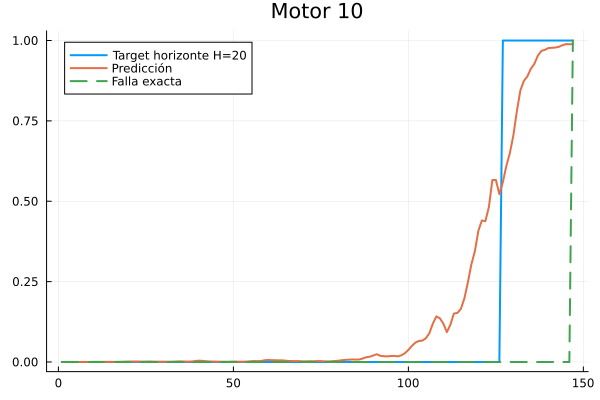

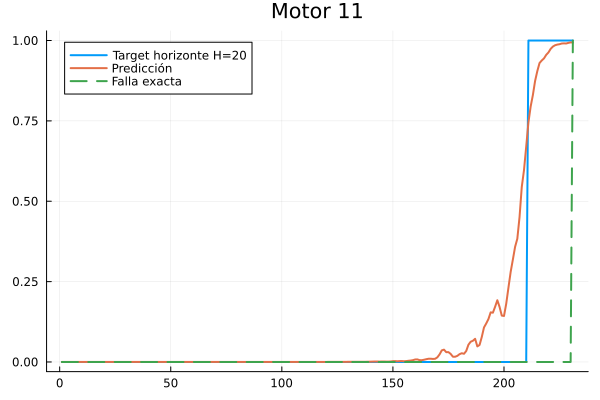

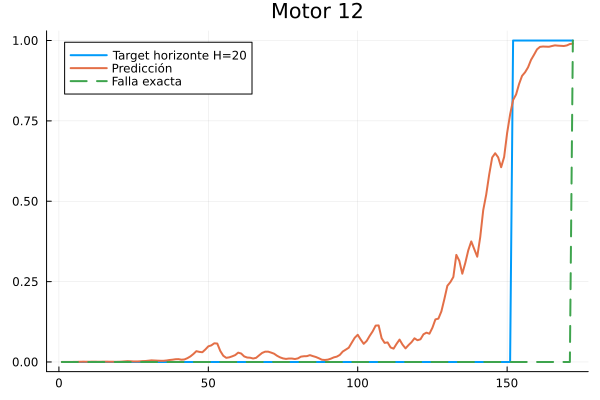

In [66]:
for (i, traj_plot) in enumerate(test_trajs)

    pred = predict_traj_sensors_lambda(
        p_trained_ude_sensors,
        traj_plot
    )

    p = plot(
        traj_plot.t,
        traj_plot.y,
        label = "Target horizonte H=$H",
        linewidth = 2,
        title = "Motor $i"
    )

    plot!(
        p,
        traj_plot.t,
        pred,
        label = "Predicción",
        linewidth = 2
    )

    plot!(
        p,
        traj_plot.t,
        traj_plot.y_exact,
        label = "Falla exacta",
        linewidth = 2,
        linestyle = :dash
    )

    display(p)

end

In [67]:
df_eval = failure_timing_df_lambda(
    test_trajs,
    p_trained_ude_sensors;
    threshold=0.989
)

df_eval

Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64,Int64?,Int64?
1,1,215,207,-8
2,2,198,195,-3
3,3,213,missing,missing
4,4,213,206,-7
5,5,195,195,0
6,6,257,missing,missing
7,7,193,190,-3
8,8,275,missing,missing
9,9,137,135,-2


In [68]:
add_result!(
    results_df,
    "UDE_lambda",
    df_eval
)

results_df

Row,model_name,mean_error,median_error,std_error,mae,rmse,early_rate,late_rate,exact_rate,detection_rate,missing_rate
,String,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64,Float64
1,UDE_horizon,-3.375,-2.5,3.02076,3.375,4.4017,0.75,0.0,0.25,0.666667,0.333333
2,UDE_exacto,-15.4545,-12.0,9.79146,15.4545,18.0555,1.0,0.0,0.0,0.916667,0.0833333
3,UDE_lambda,-3.625,-3.0,2.82527,3.625,4.48609,0.875,0.0,0.125,0.666667,0.333333


In [69]:
guardar_predicciones!(
    predicciones_modelos,
    "UDE λ entrenable",
    test_trajs,
    p_trained_ude_sensors,
    predict_traj_sensors_lambda
)

12-element Vector{Vector{Float64}}:
 [4.5397868702434395e-5, 9.695960235012104e-5, 0.00018278881102045286, 0.0002238989636741984, 0.00031612972421263003, 0.0004914607680222257, 0.0005529067575464669, 0.0005455503047124221, 0.0007539604623891657, 0.001302881671629623  …  0.9860043776401316, 0.9899367006955478, 0.9912021053005128, 0.9901011708277112, 0.9890078324991944, 0.989377282580281, 0.9887316056983383, 0.989777341069174, 0.9911787719578072, 0.9925833726789128]
 [4.5397868702434395e-5, 7.18813547852738e-5, 8.102523911866513e-5, 0.00010912668893915872, 0.00017419299262992657, 0.0002477216780482843, 0.00026183753614343873, 0.00033394010607762056, 0.00046062407528824084, 0.00048318032149869214  …  0.9737341228331656, 0.9777458504881026, 0.9826830952192072, 0.9838059238933446, 0.9851887128426488, 0.9879886720473908, 0.9891347749465255, 0.9899973064232414, 0.991566842587556, 0.9911841464159896]
 [4.5397868702434395e-5, 4.824645982592835e-5, 4.490605219005464e-5, 3.919900939720458e-5, 3.9

### Método horizon regularizado

Agregamos términos de regularización a la función de costo.

In [70]:
function loss_many_sensors_horizon_reg(
    p,
    trajs;
    pos_weight = 1.0f0,
    λ_curve = 5f-3,
    λ_drop = 1f-2,
    ϵ = 1f-7
)

    total_bce = 0.0f0
    total_curve = 0.0f0
    total_drop = 0.0f0
    total_points = 0

    for traj in trajs

        h = predict_traj_sensors(p, traj)
        y = traj.y

        # BCE con horizonte
        total_bce += -sum(
            pos_weight .* y .* log.(h .+ ϵ) .+
            (1 .- y) .* log.(1 .- h .+ ϵ)
        )

        # diferencias de primer orden
        d1 = diff(h)

        # penaliza caídas locales: si d1 < 0, castiga
        if !isempty(d1)
            total_drop += mean(max.(0.0f0, .-d1).^2)
        end

        # diferencias de segundo orden: penaliza "pinchos"
        if length(d1) >= 2
            d2 = diff(d1)
            total_curve += mean(d2 .^ 2)
        end

        total_points += length(y)

    end

    bce_term = total_bce / total_points
    curve_term = total_curve / length(trajs)
    drop_term = total_drop / length(trajs)

    return bce_term + λ_curve * curve_term + λ_drop * drop_term

end

loss_many_sensors_horizon_reg (generic function with 1 method)

In [71]:
H = 20

train_trajs, test_trajs = build_train_test_trajs_sensors_horizon(
    trajectories;
    n_motors=60,
    test_ratio=0.2,
    shuffle=false,
    sensors=sensor_indices,
    H=H
)

pos_weight = compute_pos_weight(train_trajs)

n_sensors = length(train_trajs[1].sensor_interps)

show("Cantidad de sensores usados: ")
show(n_sensors)

input_dim = 2 + n_sensors

nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)

α = 0.05


usando 60 de 100 motores
"Cantidad de sensores usados: "5

0.05

In [72]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 125
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================


p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors_horizon_reg(
                p,
                batch,
                pos_weight = pos_weight
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors_horizon_reg(
        p_current,
        train_trajs,
        pos_weight = pos_weight
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )

end

p_trained_ude_sensors = best_params

epoch=1 | batch_loss=0.670346 | train_loss=0.642508 | best=0.642508
epoch=2 | batch_loss=0.629503 | train_loss=0.609394 | best=0.609394
epoch=3 | batch_loss=0.601836 | train_loss=0.579345 | best=0.579345
epoch=4 | batch_loss=0.566309 | train_loss=0.550032 | best=0.550032
epoch=5 | batch_loss=0.540598 | train_loss=0.521115 | best=0.521115
epoch=6 | batch_loss=0.507408 | train_loss=0.494746 | best=0.494746
epoch=7 | batch_loss=0.550399 | train_loss=0.479885 | best=0.479885
epoch=8 | batch_loss=0.479491 | train_loss=0.471983 | best=0.471983
epoch=9 | batch_loss=0.468424 | train_loss=0.461598 | best=0.461598
epoch=10 | batch_loss=0.458165 | train_loss=0.449659 | best=0.449659
epoch=11 | batch_loss=0.446205 | train_loss=0.436883 | best=0.436883
epoch=12 | batch_loss=0.431901 | train_loss=0.423904 | best=0.423904
epoch=13 | batch_loss=0.423579 | train_loss=0.411202 | best=0.411202
epoch=14 | batch_loss=0.40741 | train_loss=0.398627 | best=0.398627
epoch=15 | batch_loss=0.393141 | train_loss=

ComponentVector{Float32}(layer_1 = (weight = Float32[-0.6159954 -0.14160162 … -0.39206168 0.79132783; -1.0051608 0.47979105 … -0.33572057 0.23121345; … ; 0.69284356 -1.0955967 … 0.22145163 -0.5895336; 0.4067817 -0.5848901 … -0.1399203 0.73460686], bias = Float32[0.0730613, 0.06893566, 0.48566943, 0.25434098, -0.078186825, 0.08624596, -0.44455513, 0.3725096]), layer_2 = (weight = Float32[0.30005515 -0.0804838 … 0.55904377 -0.23312017], bias = Float32[0.03054932]))

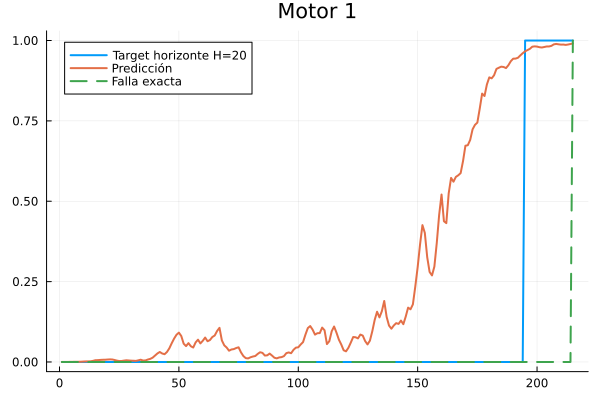

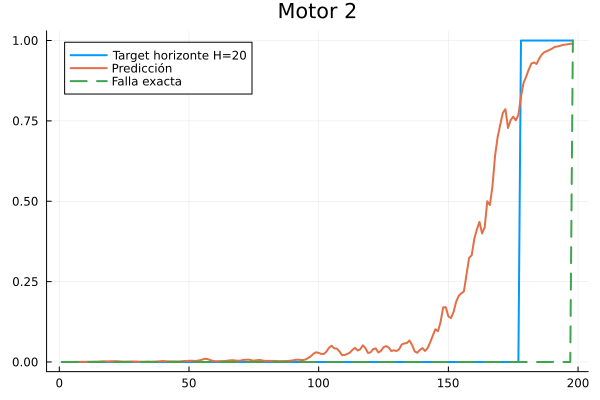

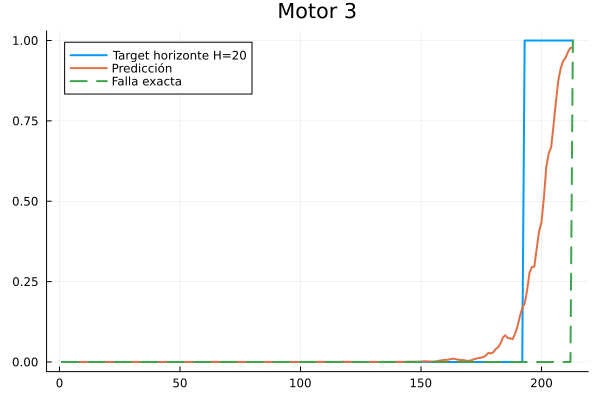

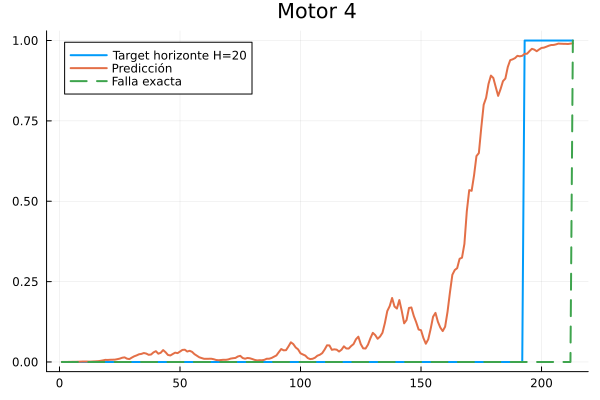

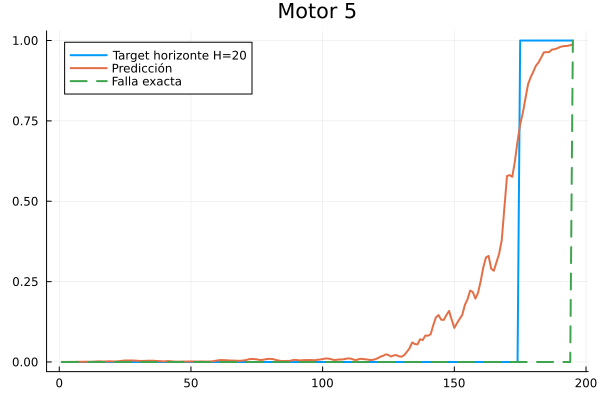

...

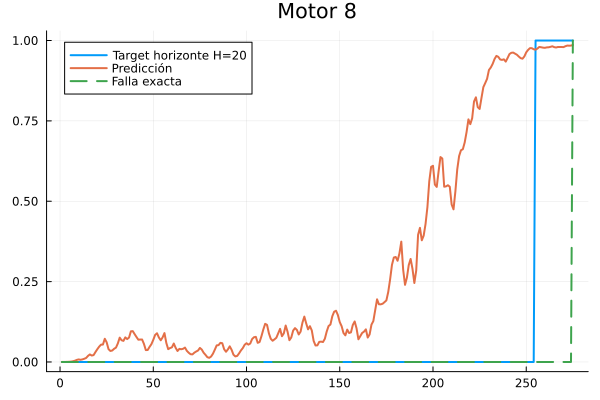

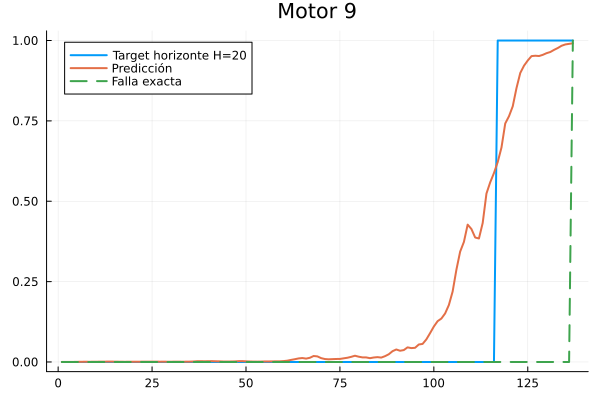

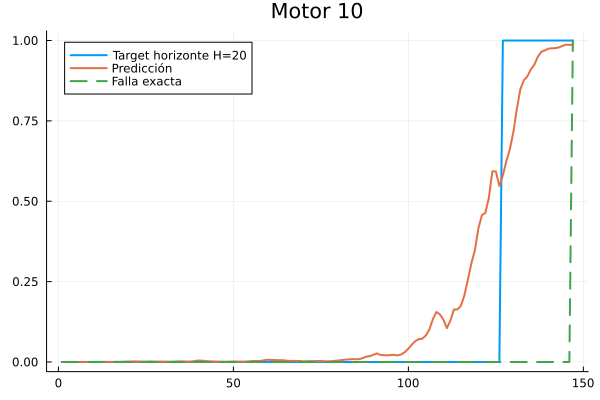

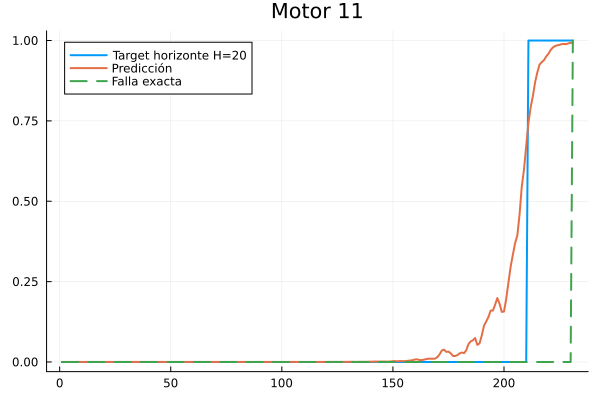

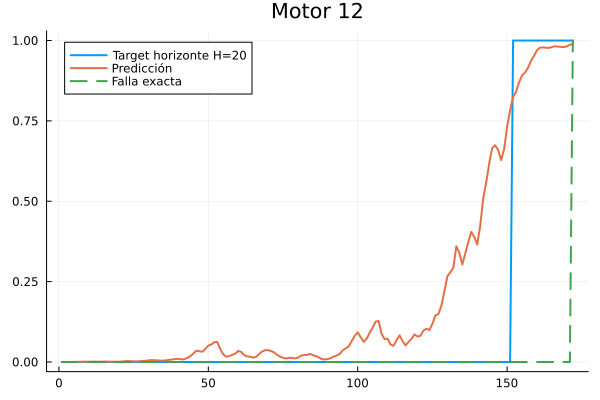

In [73]:
for (i, traj_plot) in enumerate(test_trajs)

    pred = predict_traj_sensors(
        p_trained_ude_sensors,
        traj_plot
    )

    p = plot(
        traj_plot.t,
        traj_plot.y,
        label = "Target horizonte H=$H",
        linewidth = 2,
        title = "Motor $i"
    )

    plot!(
        p,
        traj_plot.t,
        pred,
        label = "Predicción",
        linewidth = 2
    )

    plot!(
        p,
        traj_plot.t,
        traj_plot.y_exact,
        label = "Falla exacta",
        linewidth = 2,
        linestyle = :dash
    )

    display(p)

end

In [74]:
df_eval = failure_timing_df(
    test_trajs,
    p_trained_ude_sensors;
    threshold=0.989
)

df_eval

Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64,Int64?,Int64?
1,1,215,208,-7
2,2,198,197,-1
3,3,213,missing,missing
4,4,213,207,-6
5,5,195,missing,missing
6,6,257,missing,missing
7,7,193,missing,missing
8,8,275,missing,missing
9,9,137,136,-1


In [75]:
add_result!(
    results_df,
    "UDE_reg",
    df_eval
)

results_df

Row,model_name,mean_error,median_error,std_error,mae,rmse,early_rate,late_rate,exact_rate,detection_rate,missing_rate
,String,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64,Float64
1,UDE_horizon,-3.375,-2.5,3.02076,3.375,4.4017,0.75,0.0,0.25,0.666667,0.333333
2,UDE_exacto,-15.4545,-12.0,9.79146,15.4545,18.0555,1.0,0.0,0.0,0.916667,0.0833333
3,UDE_lambda,-3.625,-3.0,2.82527,3.625,4.48609,0.875,0.0,0.125,0.666667,0.333333
4,UDE_reg,-3.8,-4.0,2.77489,3.8,4.53872,1.0,0.0,0.0,0.416667,0.583333


In [76]:
guardar_predicciones!(
    predicciones_modelos,
    "UDE regularizada",
    test_trajs,
    p_trained_ude_sensors,
    predict_traj_sensors
)

12-element Vector{Vector{Float64}}:
 [4.5397868702434395e-5, 9.486965572699504e-5, 0.00017693163612518865, 0.00021702978033547436, 0.0003032034222042034, 0.00047658041015909445, 0.0005546960346102307, 0.0005598746290536872, 0.0007759169981749992, 0.0013112392682165315  …  0.9832852135310438, 0.9879537903090643, 0.9893484181424492, 0.9881842165339417, 0.9872487277585345, 0.9874258853556367, 0.9863940382684172, 0.987549772117006, 0.9891499176619987, 0.9908971838410807]
 [4.5397868702434395e-5, 7.209799952603618e-5, 8.252455337794312e-5, 0.00011204886620368167, 0.00017779201727673505, 0.00025237847920349876, 0.0002690785979523521, 0.00034232095687938586, 0.00047085725924108783, 0.0004941135280760615  …  0.9707741896753467, 0.9748186707802984, 0.9799345637463978, 0.9813627732392936, 0.9830940024811965, 0.9860703574720454, 0.9872394886866953, 0.9882105837708808, 0.9899225897443893, 0.9894776427121393]
 [4.5397868702434395e-5, 4.7883558591290135e-5, 4.403234596950134e-5, 3.856557100081362e-5

## <u>Modelo acumulativo de degradación</u>

Vamos a probar el siguiente modelo:

$$
\frac{dz}{dt} = softplus(NN(\tau, S(t)))
$$

Con esto:
+ $z(t)$ es monótono creciente
+ La degradación puede solo acumularse
+ Es mucho más interpretable

Definimos el modelo y las funciones correspondientes

In [38]:
function node_sensors!(dz, z, p, τ, S)

    input = [τ; S] 

    out, _ = nn2(input, p, st_ude_sensors)

    dz[1] =  softplus(out[1])

end


function predict_node(p, traj)

    tvec = traj.t
    y = traj.y

    z0 = [-10.0] #seguimos con eso...

    t0 = tvec[1]
    tf = tvec[end]
    tspan = (t0, tf)

    function f!(du, z, p, t)

        S = [
            interp(clamp(t, t0, tf))
            for interp in traj.sensor_interps
        ]

        τ = t / max_cycle_train

        node_sensors!(du, z, p, τ, S)

    end

    prob = ODEProblem(f!, z0, tspan, p)

    sol = solve(
        prob,
        Tsit5(),
        saveat=tvec,
        abstol=1e-6,
        reltol=1e-6,
        dtmax=1.0
    )

    z_pred = Array(sol)[1, :]

    h_pred = σ.(z_pred)

    return h_pred

end

function loss_many_sensors_horizon(p, trajs, pos_weight=100f0)

    total_loss = 0f0
    total_points = 0
    ϵ = 1f-7 #el epsilon es para no evaluar log(0)

    for traj in trajs
        h = predict_node(p, traj)
        y = traj.y

        total_loss += -sum(pos_weight .* y .* log.(h .+ ϵ) .+ (1 .- y) .* log.(1 .- h .+ ϵ))
        total_points += length(y)
    end

    return total_loss / total_points

end



loss_many_sensors_horizon (generic function with 2 methods)

In [39]:
H = 20

train_trajs, test_trajs = build_train_test_trajs_sensors_horizon(
    trajectories;
    n_motors=60,
    test_ratio=0.2,
    shuffle=false,
    sensors=sensor_indices,
    H=H
)

pos_weight = compute_pos_weight(train_trajs)

n_sensors = length(train_trajs[1].sensor_interps)

show("Cantidad de sensores usados: ")
show(n_sensors)

input_dim = 1 + n_sensors

nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)


(Chain{@NamedTuple{layer_1::Dense{typeof(tanh), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.True}}, Nothing}((layer_1 = Dense(6 => 8, tanh), layer_2 = Dense(8 => 1)), nothing), (layer_1 = (weight = Float32[-0.8002301 -0.11154107 … 0.2297433 -0.33936837; -1.126803 0.42793575 … 0.8564585 -0.40935773; … ; 0.776792 -1.0434809 … 0.46109465 0.14221385; 0.653098 -0.69898045 … 0.242493 -0.2235716], bias = Float32[0.22618704, 0.12952009, 0.10270418, -0.10714972, 0.13281435, 0.11867143, -0.18424134, 0.3247917]), layer_2 = (weight = Float32[0.36106098 -0.2778279 … -0.54610264 0.26090315], bias = Float32[0.19009417])), (layer_1 = NamedTuple(), layer_2 = NamedTuple()))

In [79]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 200
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================


p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors_horizon(
                p,
                batch,
                pos_weight 
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors_horizon(
        p_current,
        train_trajs,
        pos_weight
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )

end

p_trained_ude_sensors = best_params

epoch=1 | batch_loss=12.289274 | train_loss=12.233849 | best=12.233849
epoch=2 | batch_loss=12.185054 | train_loss=12.131774 | best=12.131774
epoch=3 | batch_loss=12.083519 | train_loss=12.021395 | best=12.021395
epoch=4 | batch_loss=11.958915 | train_loss=11.901584 | best=11.901584
epoch=5 | batch_loss=11.842892 | train_loss=11.768768 | best=11.768768
epoch=6 | batch_loss=11.705006 | train_loss=11.622331 | best=11.622331
epoch=7 | batch_loss=11.554987 | train_loss=11.46229 | best=11.46229
epoch=8 | batch_loss=11.370091 | train_loss=11.284187 | best=11.284187
epoch=9 | batch_loss=11.207381 | train_loss=11.085103 | best=11.085103
epoch=10 | batch_loss=10.960168 | train_loss=10.86874 | best=10.86874
epoch=11 | batch_loss=10.76708 | train_loss=10.629039 | best=10.629039
epoch=12 | batch_loss=10.510951 | train_loss=10.371735 | best=10.371735
epoch=13 | batch_loss=10.241394 | train_loss=10.087935 | best=10.087935
epoch=14 | batch_loss=9.947102 | train_loss=9.779048 | best=9.779048
epoch=15 

ComponentVector{Float32}(layer_1 = (weight = Float32[-1.3223807 -0.05550477 … 0.21257615 -0.21386869; -0.6212654 0.46931046 … 0.74574727 -0.4009777; … ; 1.335415 -1.0496536 … 0.3925195 0.07742114; 0.30703092 -0.554111 … 0.10788767 -0.037206937], bias = Float32[-0.3878885, 0.6761042, -0.71367675, 0.3625049, 0.69068336, 0.8359847, 0.4417603, -0.066196345]), layer_2 = (weight = Float32[0.7242847 -0.6090933 … -0.7910532 0.1586911], bias = Float32[-0.27376127]))

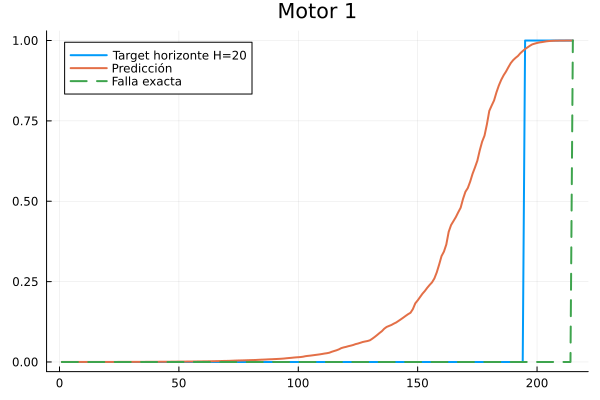

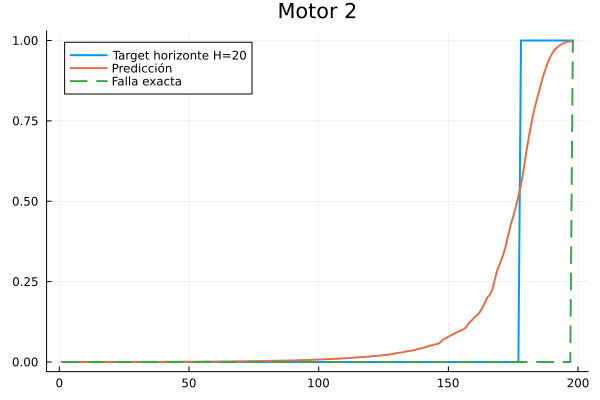

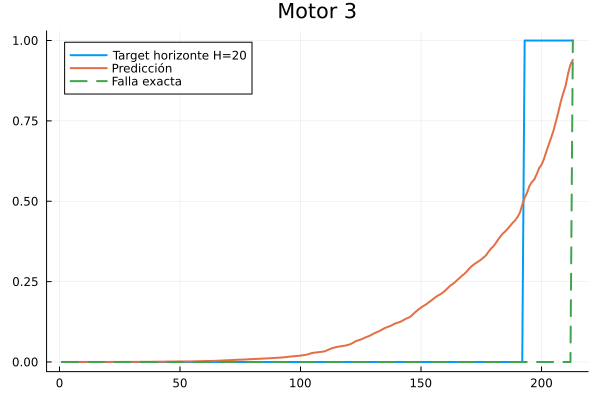

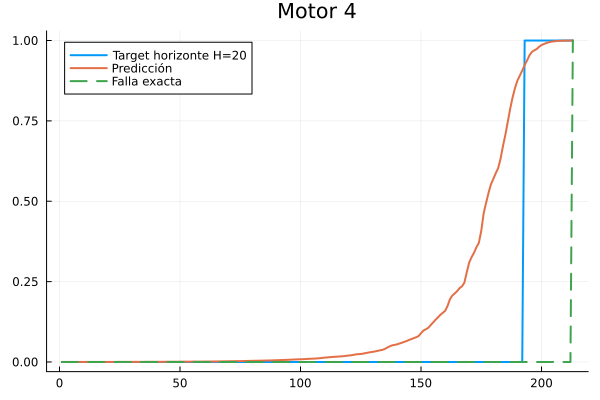

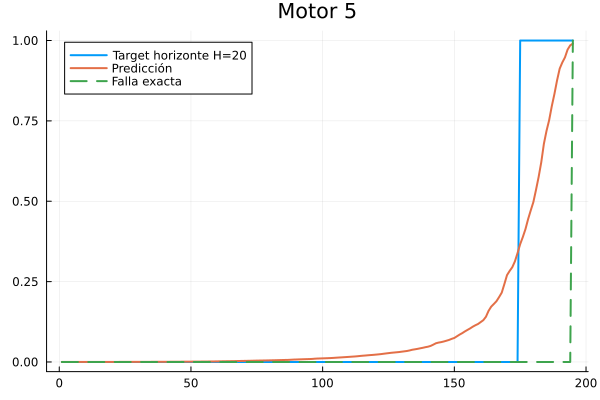

...

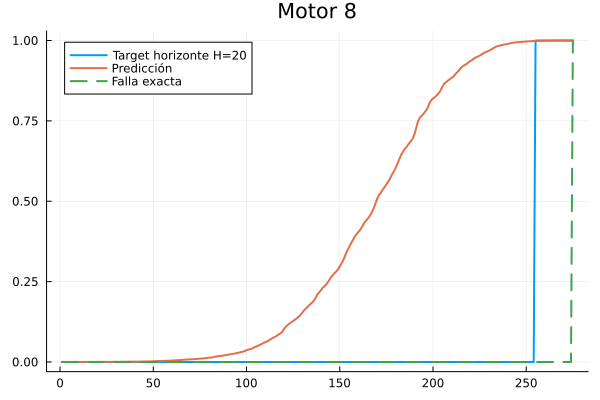

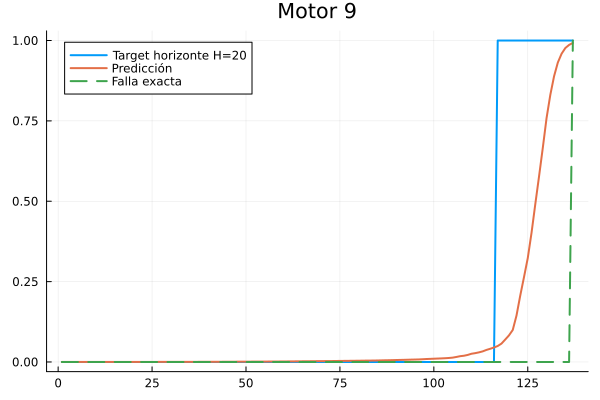

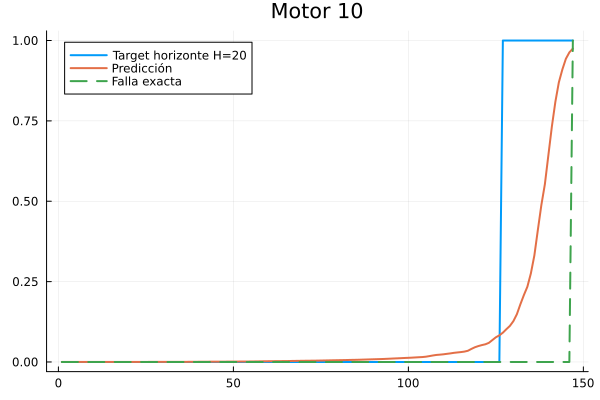

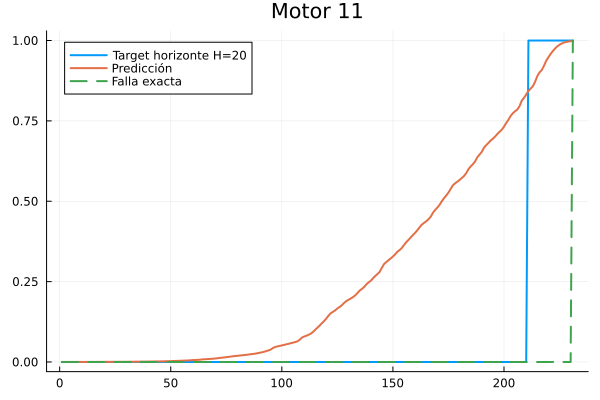

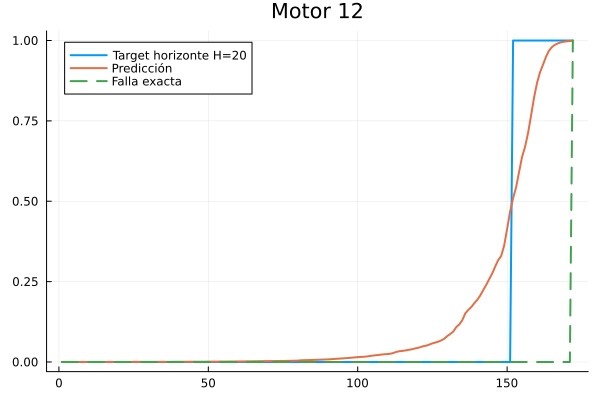

In [80]:
for (i, traj_plot) in enumerate(test_trajs)

    pred = predict_node(
        p_trained_ude_sensors,
        traj_plot
    )

    p = plot(
        traj_plot.t,
        traj_plot.y,
        label = "Target horizonte H=$H",
        linewidth = 2,
        title = "Motor $i"
    )

    plot!(
        p,
        traj_plot.t,
        pred,
        label = "Predicción",
        linewidth = 2
    )

    plot!(
        p,
        traj_plot.t,
        traj_plot.y_exact,
        label = "Falla exacta",
        linewidth = 2,
        linestyle = :dash
    )

    display(p)

end

Guardamos un gráfico para el poster!

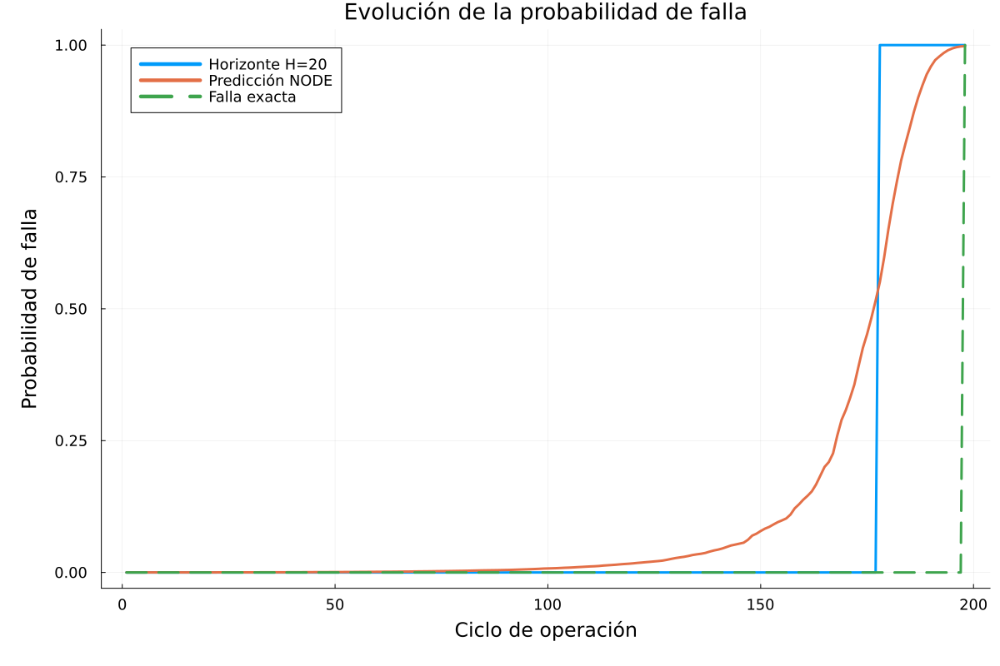

"c:\\Users\\Sebastian\\Desktop\\TP-DegradacionDeMotores\\mi_entorno\\probabilidad_falla.png"

In [81]:
using Plots

traj_plot = test_trajs[2]

pred = predict_node(
    p_trained_ude_sensors,
    traj_plot
)

p = plot(
    traj_plot.t,
    traj_plot.y,
    label = "Horizonte H=$H",
    linewidth = 3,
    xlabel = "Ciclo de operación",
    ylabel = "Probabilidad de falla",
    title = "Evolución de la probabilidad de falla",
    left_margin = 10Plots.mm,
    bottom_margin = 10Plots.mm,
    legend = :topleft,
    size = (1200, 800),
    tickfontsize = 12,
    guidefontsize = 16,
    titlefontsize = 18,
    legendfontsize = 12
)

plot!(
    p,
    traj_plot.t,
    pred,
    label = "Predicción NODE",
    linewidth = 3
)

plot!(
    p,
    traj_plot.t,
    traj_plot.y_exact,
    label = "Falla exacta",
    linewidth = 3,
    linestyle = :dash
)

display(p)

# Guardar para el póster
savefig(p, "probabilidad_falla.pdf")   # recomendado
savefig(p, "probabilidad_falla.png")   # opcional

In [40]:
function failure_timing_df_node(test_trajs, p_trained; threshold=1)

    results = DataFrame(
        motor = Int[],
        real_cycle = Int[],
        pred_cycle = Union{Missing, Int}[],
        diff_cycles = Union{Missing, Int}[]
    )

    for (i, traj) in enumerate(test_trajs)

        pred = predict_node(
            p_trained,
            traj
        )

        # ciclo real de falla
        idx_real = findfirst(==(1), traj.y_exact)

        real_cycle =
            isnothing(idx_real) ? missing :
            Int(traj.t[idx_real])

        # primer instante donde la predicción supera el umbral
        idx_pred = findfirst(>=(threshold), pred)

        pred_cycle =
            isnothing(idx_pred) ? missing :
            Int(traj.t[idx_pred])

        diff =
            ismissing(real_cycle) || ismissing(pred_cycle) ?
            missing :
            pred_cycle - real_cycle

        push!(
            results,
            (
                i,
                real_cycle,
                pred_cycle,
                diff
            )
        )

    end

    return results

end

failure_timing_df_node (generic function with 1 method)

In [83]:
df_eval = failure_timing_df_node(
    test_trajs,
    p_trained_ude_sensors;
    threshold=0.989
)

df_eval

Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64,Int64?,Int64?
1,1,215,199,-16
2,2,198,194,-4
3,3,213,missing,missing
4,4,213,201,-12
5,5,195,195,0
6,6,257,252,-5
7,7,193,missing,missing
8,8,275,240,-35
9,9,137,137,0


In [84]:
add_result!(
    results_df,
    "NODE",
    df_eval
)

results_df

Row,model_name,mean_error,median_error,std_error,mae,rmse,early_rate,late_rate,exact_rate,detection_rate,missing_rate
,String,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64,Float64
1,UDE_horizon,-3.375,-2.5,3.02076,3.375,4.4017,0.75,0.0,0.25,0.666667,0.333333
2,UDE_exacto,-15.4545,-12.0,9.79146,15.4545,18.0555,1.0,0.0,0.0,0.916667,0.0833333
3,UDE_lambda,-3.625,-3.0,2.82527,3.625,4.48609,0.875,0.0,0.125,0.666667,0.333333
4,UDE_reg,-3.8,-4.0,2.77489,3.8,4.53872,1.0,0.0,0.0,0.416667,0.583333
5,NODE,-9.11111,-5.0,11.005,9.11111,13.8082,0.777778,0.0,0.222222,0.75,0.25


In [85]:
guardar_predicciones!(
    predicciones_modelos,
    "NODE acumulativa",
    test_trajs,
    p_trained_ude_sensors,
    predict_node
)

12-element Vector{Vector{Float64}}:
 [4.5397868702434395e-5, 4.898122132634049e-5, 5.436602353625018e-5, 5.889055798470258e-5, 6.303842307073589e-5, 6.764144241863307e-5, 7.25601449076476e-5, 7.714786764495556e-5, 8.142101205909413e-5, 8.596952690335212e-5  …  0.9988722845460744, 0.9992835660034332, 0.9995104351189852, 0.9996267963475374, 0.9996948412429296, 0.9997741925603626, 0.9998385135919078, 0.9998884379537751, 0.9999247894979355, 0.9999468325756538]
 [4.5397868702434395e-5, 5.034183021172269e-5, 5.368801182882567e-5, 5.630418045619375e-5, 5.959385906033748e-5, 6.238639447154966e-5, 6.512469819630098e-5, 6.950751057081817e-5, 7.405535576460337e-5, 7.812202102728771e-5  …  0.9445192660659079, 0.9595958419686591, 0.971704461551733, 0.9786954812256908, 0.9851088340615068, 0.990261157342957, 0.9936928414586557, 0.9960759238787436, 0.9975063328785991, 0.9982293014816058]
 [4.5397868702434395e-5, 4.8081854072440736e-5, 5.1478269795490044e-5, 5.582147614564908e-5, 6.067040886470453e-5, 

## <u>Combinación de los modelos propuestos:</u>

$$
\frac{dz}{dt} = -\alpha z + softplus(NN(\tau, S(t)))
$$

tiene una interpretación interesante:

+ $-\alpha z $ modela la relajación/memoria del sistema.

+ $softplus(NN(\tau, S(t)))$ representa una tasa de degradación no negativa.


In [86]:
α = 0.05

function ude_comb!(dz, z, p, τ, S)

    input = [τ; S] 

    out, _ = nn2(input, p, st_ude_sensors)

    dz[1] = -α * z[1] + softplus(out[1])

end


function predict_comb(p, traj)

    tvec = traj.t
    y = traj.y

    z0 = [-10.0] #seguimos con eso...

    t0 = tvec[1]
    tf = tvec[end]
    tspan = (t0, tf)

    function f!(du, z, p, t)

        S = [
            interp(clamp(t, t0, tf))
            for interp in traj.sensor_interps
        ]

        τ = t / max_cycle_train

        ude_comb!(du, z, p, τ, S)

    end

    prob = ODEProblem(f!, z0, tspan, p)

    sol = solve(
        prob,
        Tsit5(),
        saveat=tvec,
        abstol=1e-6,
        reltol=1e-6,
        dtmax=1.0
    )

    z_pred = Array(sol)[1, :]

    h_pred = σ.(z_pred)

    return h_pred

end

function loss_many_sensors_horizon(p, trajs, pos_weight=100f0)

    total_loss = 0f0
    total_points = 0
    ϵ = 1f-7 #el epsilon es para no evaluar log(0)

    for traj in trajs
        h = predict_comb(p, traj)
        y = traj.y

        total_loss += -sum(pos_weight .* y .* log.(h .+ ϵ) .+ (1 .- y) .* log.(1 .- h .+ ϵ))
        total_points += length(y)
    end

    return total_loss / total_points

end



loss_many_sensors_horizon (generic function with 2 methods)

In [87]:
H = 20

train_trajs, test_trajs = build_train_test_trajs_sensors_horizon(
    trajectories;
    n_motors=60,
    test_ratio=0.2,
    shuffle=false,
    sensors=sensor_indices,
    H=H
)

pos_weight = compute_pos_weight(train_trajs)

n_sensors = length(train_trajs[1].sensor_interps)

show("Cantidad de sensores usados: ")
show(n_sensors)

input_dim = 1 + n_sensors

nn2, p_ude_sensors, st_ude_sensors = init_model(input_dim)

usando 60 de 100 motores
"Cantidad de sensores usados: "5

(Chain{@NamedTuple{layer_1::Dense{typeof(tanh), Int64, Int64, Nothing, Nothing, Static.True}, layer_2::Dense{typeof(identity), Int64, Int64, Nothing, Nothing, Static.True}}, Nothing}((layer_1 = Dense(6 => 8, tanh), layer_2 = Dense(8 => 1)), nothing), (layer_1 = (weight = Float32[-0.8002301 -0.11154107 … 0.2297433 -0.33936837; -1.126803 0.42793575 … 0.8564585 -0.40935773; … ; 0.776792 -1.0434809 … 0.46109465 0.14221385; 0.653098 -0.69898045 … 0.242493 -0.2235716], bias = Float32[0.22618704, 0.12952009, 0.10270418, -0.10714972, 0.13281435, 0.11867143, -0.18424134, 0.3247917]), layer_2 = (weight = Float32[0.36106098 -0.2778279 … -0.54610264 0.26090315], bias = Float32[0.19009417])), (layer_1 = NamedTuple(), layer_2 = NamedTuple()))

In [88]:
# ==========================================
# Hiperparámetros
# ==========================================

batch_size = 8
n_epochs = 125
lr = 1e-3

# ==========================================
# Inicialización
# ==========================================


p0 = deepcopy(p_ude_sensors)

p_current = deepcopy(p_ude_sensors)

rule = Optimisers.Adam(lr)

opt_state = Optimisers.setup(
    rule,
    p_current
)

best_loss = Inf
best_params = deepcopy(p_current)

# ==========================================
# Entrenamiento
# ==========================================

for epoch in 1:n_epochs

    loader = DataLoader(
        train_trajs,
        batchsize = batch_size,
        shuffle = true
    )

    batch_losses = Float64[]

    for batch in loader

        L, grads = Zygote.withgradient(
            p -> loss_many_sensors_horizon(
                p,
                batch,
                pos_weight 
            ),
            p_current
        )

        opt_state, p_current = Optimisers.update(
            opt_state,
            p_current,
            grads[1]
        )

        push!(batch_losses, L)

    end

    train_loss = loss_many_sensors_horizon(
        p_current,
        train_trajs,
        pos_weight
    )

    if train_loss < best_loss

        best_loss = train_loss
        best_params = deepcopy(p_current)

    end

    println(
        "epoch=$epoch | " *
        "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
        "train_loss=$(round(train_loss, digits=6)) | " *
        "best=$(round(best_loss, digits=6))"
    )

end

p_trained_ude_sensors = best_params

epoch=1 | batch_loss=10.438078 | train_loss=10.242483 | best=10.242483
epoch=2 | batch_loss=10.159182 | train_loss=9.951881 | best=9.951881
epoch=3 | batch_loss=9.865399 | train_loss=9.672836 | best=9.672836
epoch=4 | batch_loss=9.585109 | train_loss=9.408461 | best=9.408461
epoch=5 | batch_loss=9.31701 | train_loss=9.151559 | best=9.151559
epoch=6 | batch_loss=9.073877 | train_loss=8.906791 | best=8.906791
epoch=7 | batch_loss=8.852019 | train_loss=8.678293 | best=8.678293
epoch=8 | batch_loss=8.582288 | train_loss=8.463857 | best=8.463857
epoch=9 | batch_loss=8.376399 | train_loss=8.256505 | best=8.256505
epoch=10 | batch_loss=8.184276 | train_loss=8.062082 | best=8.062082
epoch=11 | batch_loss=7.977649 | train_loss=7.879177 | best=7.879177
epoch=12 | batch_loss=7.83562 | train_loss=7.704739 | best=7.704739
epoch=13 | batch_loss=7.647387 | train_loss=7.540282 | best=7.540282
epoch=14 | batch_loss=7.47159 | train_loss=7.384675 | best=7.384675
epoch=15 | batch_loss=7.336283 | train_los

ComponentVector{Float32}(layer_1 = (weight = Float32[-1.3155501 -0.07146516 … 0.22871634 -0.22768536; -0.70142245 0.27771398 … 0.9488347 -0.554098; … ; 1.2793778 -1.0094453 … 0.34624204 0.088169396; 0.28991783 -0.5518374 … 0.14247712 -0.05861974], bias = Float32[-0.28733933, 0.5381969, -0.47270477, -0.47631928, 0.6623688, 0.73777294, 0.3127518, -0.026244966]), layer_2 = (weight = Float32[0.8566024 -0.27487794 … -0.97666544 0.09034963], bias = Float32[-0.24209848]))

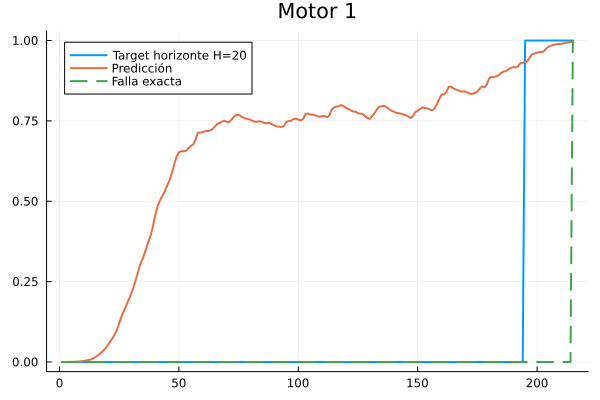

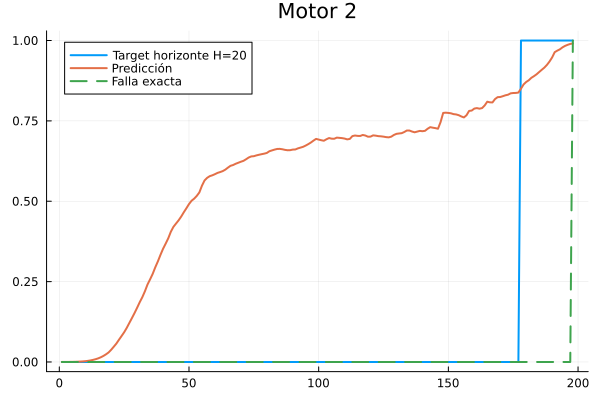

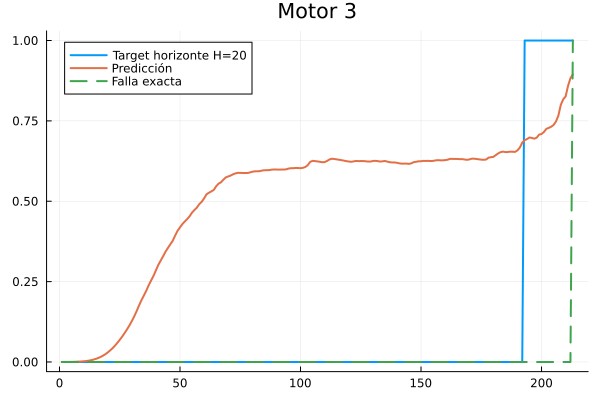

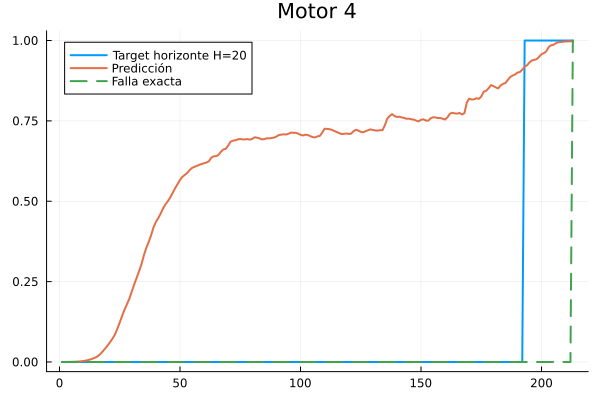

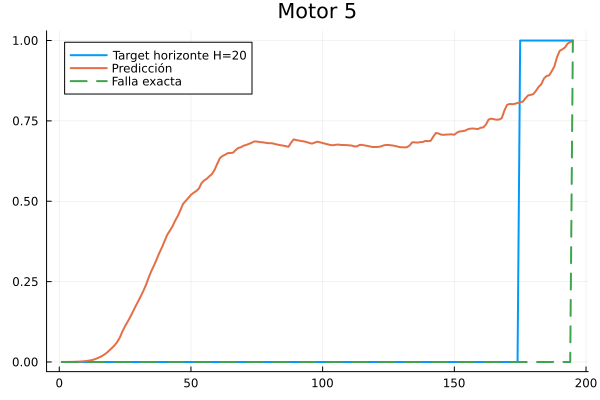

...

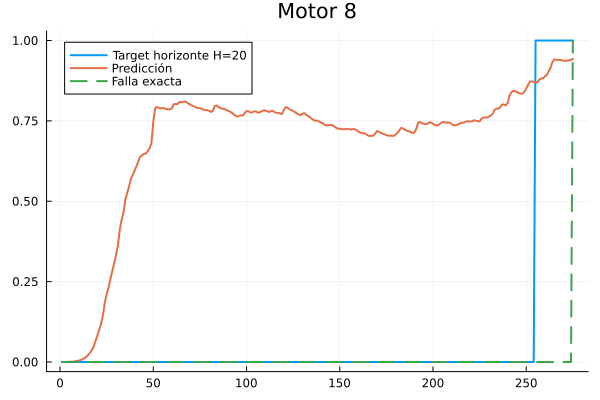

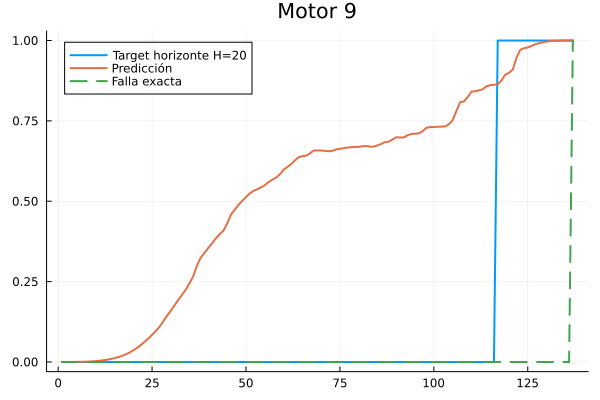

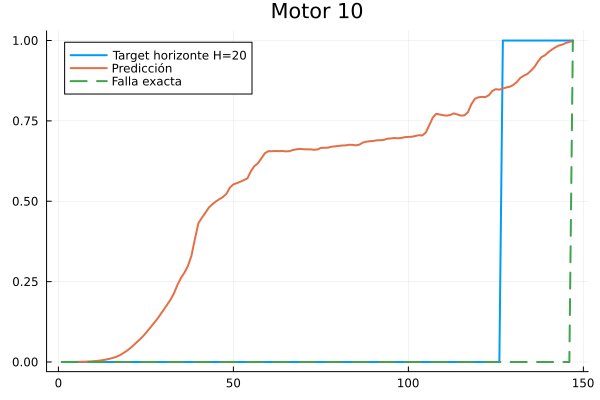

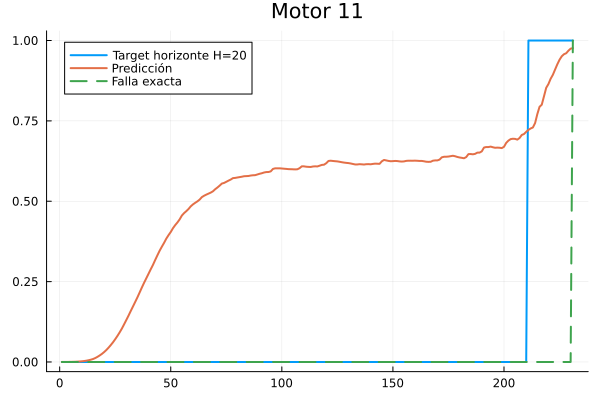

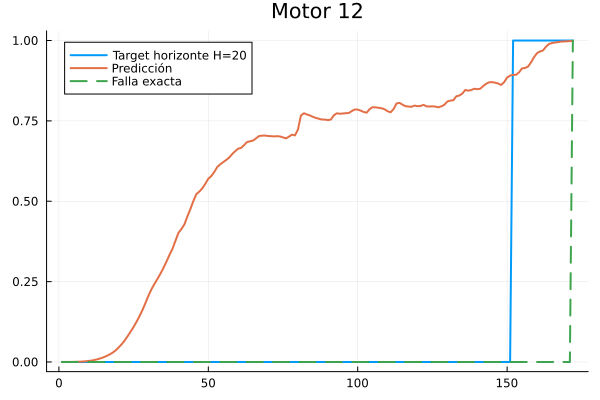

In [89]:
for (i, traj_plot) in enumerate(test_trajs)

    pred = predict_comb(
        p_trained_ude_sensors,
        traj_plot
    )

    p = plot(
        traj_plot.t,
        traj_plot.y,
        label = "Target horizonte H=$H",
        linewidth = 2,
        title = "Motor $i"
    )

    plot!(
        p,
        traj_plot.t,
        pred,
        label = "Predicción",
        linewidth = 2
    )

    plot!(
        p,
        traj_plot.t,
        traj_plot.y_exact,
        label = "Falla exacta",
        linewidth = 2,
        linestyle = :dash
    )

    display(p)

end

In [41]:
function failure_timing_df_comb(test_trajs, p_trained; threshold=1)

    results = DataFrame(
        motor = Int[],
        real_cycle = Int[],
        pred_cycle = Union{Missing, Int}[],
        diff_cycles = Union{Missing, Int}[]
    )

    for (i, traj) in enumerate(test_trajs)

        pred = predict_comb(
            p_trained,
            traj
        )

        # ciclo real de falla
        idx_real = findfirst(==(1), traj.y_exact)

        real_cycle =
            isnothing(idx_real) ? missing :
            Int(traj.t[idx_real])

        # primer instante donde la predicción supera el umbral
        idx_pred = findfirst(>=(threshold), pred)

        pred_cycle =
            isnothing(idx_pred) ? missing :
            Int(traj.t[idx_pred])

        diff =
            ismissing(real_cycle) || ismissing(pred_cycle) ?
            missing :
            pred_cycle - real_cycle

        push!(
            results,
            (
                i,
                real_cycle,
                pred_cycle,
                diff
            )
        )

    end

    return results

end

failure_timing_df_comb (generic function with 1 method)

In [91]:
df_eval = failure_timing_df_comb(
    test_trajs,
    p_trained_ude_sensors;
    threshold=0.989
)

df_eval

Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64,Int64?,Int64?
1,1,215,209,-6
2,2,198,197,-1
3,3,213,missing,missing
4,4,213,206,-7
5,5,195,193,-2
6,6,257,missing,missing
7,7,193,193,0
8,8,275,missing,missing
9,9,137,128,-9


In [92]:
add_result!(
    results_df,
    "UDE_comb",
    df_eval
)

results_df

Row,model_name,mean_error,median_error,std_error,mae,rmse,early_rate,late_rate,exact_rate,detection_rate,missing_rate
,String,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64,Float64
1,UDE_horizon,-3.375,-2.5,3.02076,3.375,4.4017,0.75,0.0,0.25,0.666667,0.333333
2,UDE_exacto,-15.4545,-12.0,9.79146,15.4545,18.0555,1.0,0.0,0.0,0.916667,0.0833333
3,UDE_lambda,-3.625,-3.0,2.82527,3.625,4.48609,0.875,0.0,0.125,0.666667,0.333333
4,UDE_reg,-3.8,-4.0,2.77489,3.8,4.53872,1.0,0.0,0.0,0.416667,0.583333
5,NODE,-9.11111,-5.0,11.005,9.11111,13.8082,0.777778,0.0,0.222222,0.75,0.25
6,UDE_comb,-4.375,-4.0,3.50255,4.375,5.4658,0.875,0.0,0.125,0.666667,0.333333


In [93]:
guardar_predicciones!(
    predicciones_modelos,
    "UDE combinada",
    test_trajs,
    p_trained_ude_sensors,
    predict_comb
)

12-element Vector{Vector{Float64}}:
 [4.5397868702434395e-5, 8.164568886894962e-5, 0.00014495463040785733, 0.00024009430245311585, 0.00038524513001785937, 0.0006147507403242603, 0.0009523931030958492, 0.0014141110822454386, 0.0020711014224805984, 0.0029821104799543493  …  0.9843222345641433, 0.9867784084170202, 0.9880583634266811, 0.9892026200430043, 0.9893322698509284, 0.9909948469638378, 0.9925449220290666, 0.9938387686679627, 0.9956645709352329, 0.996349473288063]
 [4.5397868702434395e-5, 7.945495428065558e-5, 0.00013193470818944196, 0.00021365609277473375, 0.0003398332076732669, 0.0005233844744325847, 0.0007830977901776869, 0.0011661539401461943, 0.0017134359497172535, 0.0024278897001749253  …  0.9346527389012874, 0.9472857376002769, 0.9637569314821102, 0.9685284859205919, 0.9726022567781827, 0.9787033274493804, 0.9832791692555115, 0.9866261477153957, 0.9893500498782412, 0.9908601632390913]
 [4.5397868702434395e-5, 7.59442684844096e-5, 0.00012383928323430105, 0.00019752594277408126

## Trayectorias combinadas (motor 6)

comparamos todas las predicciones para un mismo motor.

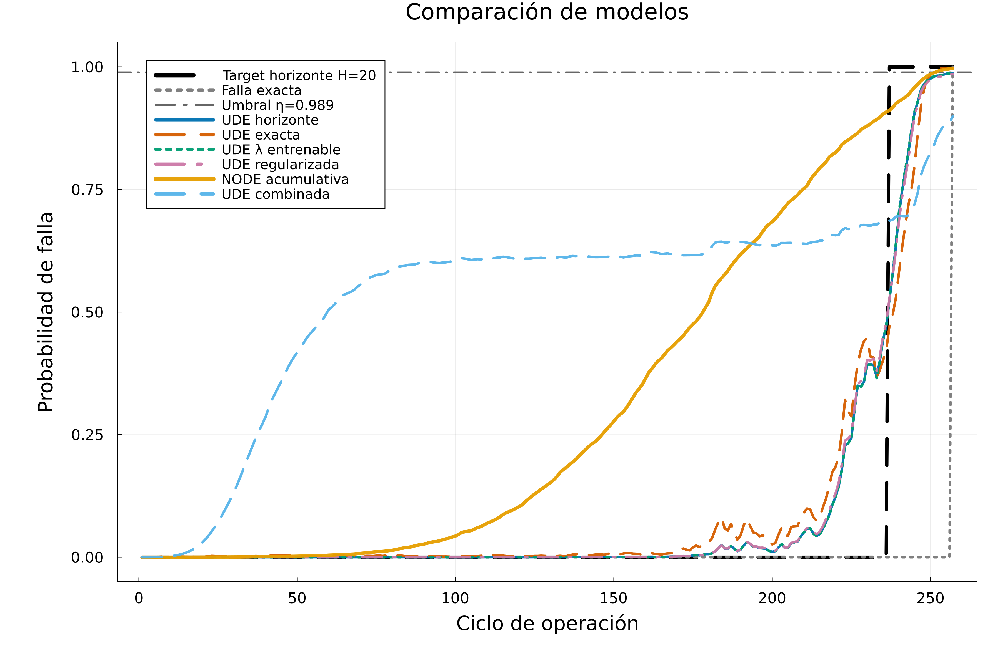

In [94]:

function plot_comparacion_motor(
    predicciones_modelos,
    test_trajs;
    motor_idx = 6,
    H = 20,
    threshold = 0.989
)

    traj = test_trajs[motor_idx]

    p = plot(
    traj.t,
    traj.y,
    label = "Target horizonte H=$H",
    linewidth = 4,
    linestyle = :dash,
    color = :black,
    xlabel = "Ciclo de operación",
    ylabel = "Probabilidad de falla",
    title = "Comparación de modelos",
    ylim = (-0.05, 1.05),
    #legend = :outerright,

    # Mismo tamaño que el gráfico anterior
    size = (1200, 800),

    # Márgenes para que entren bien los labels
    left_margin = 15Plots.mm,
    bottom_margin = 12Plots.mm,
    right_margin = 5Plots.mm,
    top_margin = 5Plots.mm,

    # Tipografías aptas para póster
    tickfontsize = 12,
    guidefontsize = 16,
    titlefontsize = 18,
    legendfontsize = 11,

    dpi = 300
    )

    plot!(
        p,
        traj.t,
        traj.y_exact,
        label = "Falla exacta",
        linewidth = 3,
        linestyle = :dot,
        color = :gray
    )

    hline!(
        p,
        [threshold],
        label = "Umbral η=$threshold",
        linewidth = 2,
        linestyle = :dashdot,
        color = :gray40
    )

    estilos_modelos = Dict(
        "UDE horizonte"     => ("#0072B2", :solid,    3),
        "UDE exacta"        => ("#D55E00", :dash,     3),
        "UDE λ entrenable"  => ("#009E73", :dot,      3),
        "UDE regularizada"  => ("#CC79A7", :dashdot,  3),
        "NODE acumulativa"  => ("#E69F00", :solid,    4),
        "UDE combinada"     => ("#56B4E9", :dash,     3)
    )

    orden_modelos = [
        "UDE horizonte",
        "UDE exacta",
        "UDE λ entrenable",
        "UDE regularizada",
        "NODE acumulativa",
        "UDE combinada"
    ]

    for nombre in orden_modelos
        if haskey(predicciones_modelos, nombre)

            color_modelo, estilo_linea, grosor = estilos_modelos[nombre]
            y_pred = predicciones_modelos[nombre][motor_idx]

            plot!(
                p,
                traj.t,
                y_pred,
                label = nombre,
                linewidth = grosor,
                linestyle = estilo_linea,
                color = color_modelo,
                alpha = 0.95
            )
        end
    end

    return p
end

p_motor6 = plot_comparacion_motor(
    predicciones_modelos,
    test_trajs;
    motor_idx = 6,
    H = H,
    threshold = 0.989
)

display(p_motor6)

In [95]:
savefig(p_motor6, "comparacion_modelos_motor_6.png")
savefig(p_motor6, "comparacion_modelos_motor_6.pdf")

"c:\\Users\\Sebastian\\Desktop\\TP-DegradacionDeMotores\\mi_entorno\\comparacion_modelos_motor_6.pdf"

## Regresión logística

Además de los modelos basados en ecuaciones diferenciales neuronales (NODE) y ecuaciones diferenciales universales (UDE), se consideró un enfoque clásico de aprendizaje supervisado mediante regresión logística.

El objetivo de este experimento es contar con una línea base (baseline) sencilla que permita evaluar si la complejidad adicional introducida por los modelos dinámicos se traduce efectivamente en una mejora en la capacidad de detección de fallas.

Para cada instante temporal de una trayectoria se construyó un vector de características compuesto por las mediciones de los sensores seleccionados y una variable temporal normalizada. A partir de estas variables, la regresión logística estima la probabilidad de que el motor falle.

Matemáticamente, el modelo estima

$$
P(Y=1 \mid X) = \sigma(\beta_0 + \beta^T X),
$$

donde $X$ representa el vector de características, $\beta$ son los parámetros a estimar y $\sigma(\cdot)$ es la función sigmoide

$$
\sigma(x)=\frac{1}{1+e^{-x}}.
$$

Una vez obtenidas las probabilidades predichas, se define un umbral de decisión para determinar el primer ciclo en el que el modelo detecta una falla inminente. Esto permite comparar la regresión logística con los modelos NODE y UDE utilizando las mismas métricas de evaluación desarrolladas previamente.

La regresión la realizamos para el enfoque exacto

In [59]:
train_trajs, test_trajs = build_train_test_trajs_sensors(
    trajectories;
    n_motors=60,
    sensors = sensor_indices
)

max_cycle_train = maximum(
    maximum(traj.t)
    for traj in train_trajs
)


#para hacer la regresion logistica neceistamos tener los datos en un data frame.
function trajs_to_dataframe(trajs)

    rows = Vector{Vector{Float64}}()

    n_sensors = length(trajs[1].sensor_interps)

    for traj in trajs

        

        for (i,t) in enumerate(traj.t)

            S = [
                interp(t)
                for interp in traj.sensor_interps
            ]

            τ = t / max_cycle_train

            push!(
                rows,
                vcat(S, τ, traj.y[i])
            )
        end
    end

    colnames = [
        Symbol("sensor_$i")
        for i in 1:n_sensors
    ]

    push!(colnames, :tau)
    push!(colnames, :y)

    return DataFrame(
        hcat(rows...)',
        colnames
    )

end

trajs_to_dataframe (generic function with 1 method)

In [44]:
df_train = trajs_to_dataframe(train_trajs)
df_test  = trajs_to_dataframe(test_trajs)

Row,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,tau,y
,Float64,Float64,Float64,Float64,Float64,Float64,Float64
1,-0.0792555,-0.617133,0.539438,0.297264,-0.741788,0.00348432,0.0
2,-0.00437364,-0.187857,-0.560784,-1.08589,-0.621801,0.00696864,0.0
3,-0.116696,-0.523812,-0.632839,-0.255998,0.77805,0.010453,0.0
4,-0.902956,-0.798442,-0.947848,0.463242,0.11812,0.0139373,0.0
5,-0.453665,0.0921054,-0.271641,-0.145345,-0.0218648,0.0174216,0.0
6,-0.0418146,-0.961086,0.909874,-0.0900193,-0.401824,0.0209059,0.0
7,-0.453665,-0.894429,-0.33261,-0.145345,0.21811,0.0243902,0.0
8,-0.565988,-0.723785,0.171774,0.186611,0.318099,0.0278746,0.0
9,0.220272,-0.305175,-0.175568,0.131285,-0.281837,0.0313589,0.0


In [45]:
names(df_train)

7-element Vector{String}:
 "sensor_1"
 "sensor_2"
 "sensor_3"
 "sensor_4"
 "sensor_5"
 "tau"
 "y"

Ajustamos

In [100]:
logit_model_tau = glm(
    @formula(y ~ sensor_1 + sensor_2 + sensor_3 + sensor_4 + sensor_5 + tau),
    df_train,
    Binomial(),
    LogitLink();
    maxiter = 500
)

StatsModels.TableRegressionModel{GeneralizedLinearModel{GLM.GlmResp{Vector{Float64}, Binomial{Float64}, LogitLink}, GLM.DensePredChol{Float64, CholeskyPivoted{Float64, Matrix{Float64}, Vector{Int64}}}}, Matrix{Float64}}

y ~ 1 + sensor_1 + sensor_2 + sensor_3 + sensor_4 + sensor_5 + tau

Coefficients:
─────────────────────────────────────────────────────────────────────────────
                  Coef.  Std. Error      z  Pr(>|z|)    Lower 95%   Upper 95%
─────────────────────────────────────────────────────────────────────────────
(Intercept)  -15.0998      1.64235   -9.19    <1e-19  -18.3188     -11.8809
sensor_1       1.75515     0.393992   4.45    <1e-05    0.982936     2.52736
sensor_2       0.693683    0.329497   2.11    0.0353    0.0478818    1.33948
sensor_3      -1.35723     0.305353  -4.44    <1e-05   -1.95571     -0.758753
sensor_4      -1.14989     0.308422  -3.73    0.0002   -1.75438     -0.545391
sensor_5       0.740553    0.286018   2.59    0.0096    0.179968     1.30114


Observación: Todos los p-value son indican que los coeficientes son significativos, excepto el de tau.

Definimos algunas funciones para poder evaluar la regresión logística de la misma manera que evaluamos los otros modelos.

In [103]:
#prediccion para una trayectoria
function predict_logistic_traj_tau(model, traj)

    n = length(traj.t)
    n_sensors = length(traj.sensor_interps)

    X = Matrix{Float64}(undef, n, n_sensors + 1)



    for (i,t) in enumerate(traj.t)

        S = [
            interp(t)
            for interp in traj.sensor_interps
        ]

        τ = t / max_cycle_train

        X[i,:] = vcat(S, τ)

    end

    colnames = [
        Symbol("sensor_$i")
        for i in 1:n_sensors
    ]

    push!(colnames, :tau)

    df = DataFrame(X, colnames)

    return GLM.predict(model, df)

end

#encontramos la primer proba que supera el umbral
function first_detection_cycle(prob, t; threshold=0.5)

    idx = findfirst(p -> p >= threshold, prob)

    isnothing(idx) && return missing

    return Int(round(t[idx]))

end

#juntamos los resultados de todos los motores en un dataframe
function evaluate_logistic_detection_tau(
    model,
    test_trajs;
    threshold=0.5
)

    results = DataFrame(
        motor = Int[],
        real_cycle = Int[],
        pred_cycle = Union{Missing,Int}[],
        diff_cycles = Union{Missing,Int}[]
    )

    for (motor_id,traj) in enumerate(test_trajs)

        prob = predict_logistic_traj_tau(
            model,
            traj
        )

        pred_cycle = first_detection_cycle(
            prob,
            traj.t;
            threshold=threshold
        )

        real_cycle = findfirst(==(1), traj.y)

        diff =
            ismissing(pred_cycle) ?
            missing :
            pred_cycle - real_cycle

        push!(
            results,
            (
                motor_id,
                real_cycle,
                pred_cycle,
                diff
            )
        )

    end

    return results

end

evaluate_logistic_detection_tau (generic function with 1 method)

Evaluamos en el conjunto de test

In [104]:
results_logit =
    evaluate_logistic_detection_tau(
        logit_model_tau,
        test_trajs;
        threshold=0.50
    )

display(results_logit)

Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64,Int64?,Int64?
1,1,215,missing,missing
2,2,198,missing,missing
3,3,213,missing,missing
4,4,213,missing,missing
5,5,195,missing,missing
6,6,257,missing,missing
7,7,193,missing,missing
8,8,275,missing,missing
9,9,137,134,-3


Métricas:

In [105]:
add_result!(
    results_df,
    "Logistic_reg",
    results_logit
)

results_df

Row,model_name,mean_error,median_error,std_error,mae,rmse,early_rate,late_rate,exact_rate,detection_rate,missing_rate
,String,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64,Float64
1,UDE_horizon,-3.375,-2.5,3.02076,3.375,4.4017,0.75,0.0,0.25,0.666667,0.333333
2,UDE_exacto,-15.4545,-12.0,9.79146,15.4545,18.0555,1.0,0.0,0.0,0.916667,0.0833333
3,UDE_lambda,-3.625,-3.0,2.82527,3.625,4.48609,0.875,0.0,0.125,0.666667,0.333333
4,UDE_reg,-3.8,-4.0,2.77489,3.8,4.53872,1.0,0.0,0.0,0.416667,0.583333
5,NODE,-9.11111,-5.0,11.005,9.11111,13.8082,0.777778,0.0,0.222222,0.75,0.25
6,UDE_comb,-4.375,-4.0,3.50255,4.375,5.4658,0.875,0.0,0.125,0.666667,0.333333
7,Logistic_reg,-2.5,-2.5,0.707107,2.5,2.54951,1.0,0.0,0.0,0.166667,0.833333


Se puede observar que no se alcanzan buenos resultados con la regresión logística, la tasa de detección es baja (~16%). Creemos que esto se debe a que este método no tiene en cuenta la trayectoria de degradación, sino toma cada ciclo como evento independiente.

## Ajuste final

Observando los resultados obtenidos, el modelo de UDE exacta es el que mayor tasa de detección presenta. Sin embargo, las detecciones en promedio son muy tempranas. Esto se puede deber a que los pesos asignados en la función de costo no son óptimos.

Para finalizar el trabajo, vamos a optimizar esos pesos y buscar la mejor performance para la formulación UDE exacta. Para evitar el data leakage vamos a dividir el dataset en train, validación y test.

In [ ]:
Pkg.add("Optimisers")
using Optimisers

In [ ]:


# ============================================================
# 1. Split original: se mantiene igual
# ============================================================

train_trajs, test_trajs = build_train_test_trajs_sensors(
    trajectories;
    n_motors = 60,
    test_ratio = 0.2,
    shuffle = false,
    sensors = sensor_indices,
)

println("Train total: ", length(train_trajs))  # 48
println("Test final: ", length(test_trajs))     # 12


# ============================================================
# 2. División interna de train para elegir c
# ============================================================

rng = MersenneTwister(2026)

indices = randperm(
    rng,
    length(train_trajs)
)

n_val = 8

val_indices = indices[1:n_val]
train_indices = indices[(n_val + 1):end]

train_c = train_trajs[train_indices]
val_c = train_trajs[val_indices]

println("Train para elegir c: ", length(train_c))  # 40
println("Validación de c: ", length(val_c))         # 8
println("Test final intacto: ", length(test_trajs)) # 12


# ============================================================
# 3. Inicialización común para todos los valores de c
# ============================================================

n_sensors = length(
    train_trajs[1].sensor_interps
)

input_dim = 2 + n_sensors

Random.seed!(1234)

nn2, p_initial, st_ude_sensors =
    init_model(input_dim)

α = 0.05


# ============================================================
# 4. Entrenamiento para un valor de c
#    Es el mismo big training que ya utilizamos
# ============================================================

function entrenar_ude_con_c(
    c_value,
    train_set,
    p_initial;
    b = 1.0,
    batch_size = 8,
    n_epochs = 125,
    lr = 1e-3,
    seed = 1234
)

    Random.seed!(seed)

    p_current = deepcopy(p_initial)

    rule = Optimisers.Adam(lr)

    opt_state = Optimisers.setup(
        rule,
        p_current
    )

    best_loss = Inf
    best_params = deepcopy(p_current)

    batch_size_real = min(
        batch_size,
        length(train_set)
    )

    for epoch in 1:n_epochs

        loader = DataLoader(
            train_set,
            batchsize = batch_size_real,
            shuffle = true
        )

        batch_losses = Float64[]

        for batch in loader

            L, grads = Zygote.withgradient(
                p -> loss_many_sensors_adj(
                    p,
                    batch;
                    b = b,
                    c = c_value
                ),
                p_current
            )

            opt_state, p_current =
                Optimisers.update(
                    opt_state,
                    p_current,
                    grads[1]
                )

            push!(
                batch_losses,
                Float64(L)
            )
        end

        train_loss = loss_many_sensors_adj(
            p_current,
            train_set;
            b = b,
            c = c_value
        )

        if train_loss < best_loss
            best_loss = train_loss
            best_params = deepcopy(p_current)
        end

        if epoch == 1 || epoch % 25 == 0

            println(
                "c=$c_value | " *
                "epoch=$epoch | " *
                "batch_loss=$(round(mean(batch_losses), digits=6)) | " *
                "train_loss=$(round(train_loss, digits=6)) | " *
                "best=$(round(best_loss, digits=6))"
            )
        end
    end

    return best_params
end


# ============================================================
# 5. Probar valores de c utilizando failure_timing_df_gral
#    La evaluación se hace únicamente sobre val_c
# ============================================================

c_values = [
    5.0,
    10.0,
    12.0,
    15.0,
    20.0
]

resultados_c = DataFrame(
    c = Float64[],
    detection_rate = Float64[],
    mean_error = Union{Missing, Float64}[],
    abs_mean_error = Union{Missing, Float64}[],
    rmse = Union{Missing, Float64}[]
)

for c_value in c_values

    println()
    println("==============================")
    println("Probando c = $c_value")
    println("==============================")

    p_candidate = entrenar_ude_con_c(
        c_value,
        train_c,
        p_initial;
        b = 1.0,
        batch_size = 8,
        n_epochs = 125,
        lr = 1e-3,
        seed = 1234
    )

    # La misma función de evaluación que usan en el big training
    df_val_c = failure_timing_df_gral(
        val_c,
        p_candidate;
        threshold = 0.989
    )

    diffs = collect(
        skipmissing(df_val_c.diff_cycles)
    )

    detection_rate =
        length(diffs) / nrow(df_val_c)

    if isempty(diffs)

        mean_error = missing
        abs_mean_error = missing
        rmse = missing

    else

        mean_error = mean(diffs)
        abs_mean_error = abs(mean_error)

        rmse = sqrt(
            mean(diffs .^ 2)
        )
    end

    push!(
        resultados_c,
        (
            c_value,
            detection_rate,
            mean_error,
            abs_mean_error,
            rmse
        )
    )

    println(
        "VALIDACIÓN | " *
        "c=$c_value | " *
        "detección=$(round(detection_rate, digits=4)) | " *
        "error medio=$mean_error | " *
        "RMSE=$rmse"
    )

    display(df_val_c)
end

display(resultados_c)


# ============================================================
# 6. Elegir el mejor c sin usar test_trajs
# ============================================================

# Con 8 motores, 0.75 exige detectar al menos 6.
min_detection = 0.75

resultados_validos = filter(
    row ->
        row.detection_rate >= min_detection &&
        !ismissing(row.abs_mean_error),
    resultados_c
)

# Si ningún c llega al mínimo, conservar los que tengan
# la mayor tasa de detección.
if nrow(resultados_validos) == 0

    max_detection = maximum(
        resultados_c.detection_rate
    )

    resultados_validos = filter(
        row ->
            row.detection_rate == max_detection &&
            !ismissing(row.abs_mean_error),
        resultados_c
    )
end

# Prioridad:
# 1. error medio más cercano a cero
# 2. menor RMSE
sort!(
    resultados_validos,
    [:abs_mean_error, :rmse]
)

mejor_c = resultados_validos.c[1]

println()
println("Mejor c según validación: ", mejor_c)

display(resultados_validos)


# ============================================================
# 7. BIG TRAINING FINAL
#    Ahora vuelve a utilizar todos los 48 motores de train_trajs
# ============================================================

p_trained_ude_sensors = entrenar_ude_con_c(
    mejor_c,
    train_trajs,
    p_initial;
    b = 1.0,
    batch_size = 8,
    n_epochs = 125,
    lr = 1e-3,
    seed = 1234
)


# ============================================================
# 8. EVALUACIÓN FINAL SOBRE test_trajs
#    Recién acá se usan los 12 motores finales
# ============================================================

df_eval = failure_timing_df_gral(
    test_trajs,
    p_trained_ude_sensors;
    threshold = 0.989
)

display(df_eval)


# ============================================================
# 9. Agregar las métricas finales a results_df
# ============================================================

add_result!(
    results_df,
    "UDE_exacto",
    df_eval
)

display(results_df)



Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64?,Int64?,Int64?
1,1,156,missing,missing
2,2,188,183,-5
3,3,231,missing,missing
4,4,199,missing,missing
5,5,194,missing,missing
6,6,158,missing,missing
7,7,240,missing,missing
8,8,147,missing,missing


Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64?,Int64?,Int64?
1,1,156,156,0
2,2,188,177,-11
3,3,231,missing,missing
4,4,199,199,0
5,5,194,194,0
6,6,158,158,0
7,7,240,240,0
8,8,147,146,-1


Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64?,Int64?,Int64?
1,1,156,155,-1
2,2,188,176,-12
3,3,231,missing,missing
4,4,199,194,-5
5,5,194,193,-1
6,6,158,158,0
7,7,240,240,0
8,8,147,146,-1


Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64?,Int64?,Int64?
1,1,156,155,-1
2,2,188,176,-12
3,3,231,missing,missing
4,4,199,192,-7
5,5,194,192,-2
6,6,158,157,-1
7,7,240,240,0
8,8,147,145,-2


Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64?,Int64?,Int64?
1,1,156,153,-3
2,2,188,169,-19
3,3,231,missing,missing
4,4,199,189,-10
5,5,194,191,-3
6,6,158,157,-1
7,7,240,239,-1
8,8,147,145,-2


Row,c,detection_rate,mean_error,abs_mean_error,rmse
,Float64,Float64,Float64?,Float64?,Float64?
1,5.0,0.125,-5.0,5.0,5.0
2,10.0,0.875,-1.71429,1.71429,4.17475
3,12.0,0.875,-2.85714,2.85714,4.95696
4,15.0,0.875,-3.57143,3.57143,5.38516
5,20.0,0.875,-5.57143,5.57143,8.3238


Row,c,detection_rate,mean_error,abs_mean_error,rmse
,Float64,Float64,Float64?,Float64?,Float64?
1,10.0,0.875,-1.71429,1.71429,4.17475
2,12.0,0.875,-2.85714,2.85714,4.95696
3,15.0,0.875,-3.57143,3.57143,5.38516
4,20.0,0.875,-5.57143,5.57143,8.3238


Row,motor,real_cycle,pred_cycle,diff_cycles
,Int64,Int64?,Int64?,Int64?
1,1,215,204,-11
2,2,198,194,-4
3,3,213,missing,missing
4,4,213,201,-12
5,5,195,193,-2
6,6,257,missing,missing
7,7,193,192,-1
8,8,275,257,-18
9,9,137,133,-4


Row,model_name,mean_error,median_error,std_error,mae,rmse,early_rate,late_rate,exact_rate,detection_rate,missing_rate
,String,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64?,Float64,Float64
1,UDE_exacto,-6.5,-4.0,5.50252,6.5,8.33667,1.0,0.0,0.0,0.833333,0.166667
2,UDE_exacto,-6.5,-4.0,5.50252,6.5,8.33667,1.0,0.0,0.0,0.833333,0.166667


Finalmente, se logró disminuir el error medio, pero a cambio se bajo también la tasa de detección. Creemos que este modelo alcanza el mejor balance entre error medio y tasa de detección.